# Select best images from synthetic images and masks generated by DatasetGAN-2-ADA

The code in this notebook aims to filter out the lower quality images generated by StyleGAN-2-ADA by two combined approaches:

A - Filter out the images with high uncertainty score (focus on bad image segmentation)

B - Filter out the anomalies by extracting features and performing one-class classification (focus on bad image quality)

# 1. Import libraries and initial declarations

In [ ]:
%matplotlib inline

import PIL.Image as Image
import numpy as np
import os, sys, gc, random, math, pickle, itertools
import ast
from tqdm import tqdm, trange
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, models, transforms
from torchvision.ops import sigmoid_focal_loss
from torcheval.metrics.functional import binary_precision, binary_recall
from torch.autograd import Variable
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler, StandardScaler, LabelEncoder
from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import SGDOneClassSVM
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, f1_score
from skimage.morphology import convex_hull_image
from scipy.stats import mannwhitneyu
import cv2 as cv
import pandas as pd
import diplib as dip
import shap
import shutil
import subprocess
import gc
from utils import *
device = "cuda:0" if torch.cuda.is_available() else "cpu"
random_state = 0
shap.initjs()

## 1.1 Set seeds

In [2]:
torch.manual_seed(random_state)
random.seed(random_state)
np.random.seed(random_state)
torch.use_deterministic_algorithms(True)
torch.cuda.manual_seed_all(random_state) # If you are using multi-GPU. In case of one GPU, you can use # torch.cuda.manual_seed(SEED).
torch.backends.cudnn.benchmark = False    # Causes cuDNN to deterministically select an algorithm, 
                                              # possibly at the cost of reduced performance 
                                              # (the algorithm itself may be nondeterministic).
torch.backends.cudnn.deterministic = True # Causes cuDNN to use a deterministic convolution algorithm, 
                                              # but may slow down performance.
                                              # It will not guarantee that your training process is deterministic 
                                              # if you are using other libraries that may use nondeterministic algorithms 

def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

g = torch.Generator()
g.manual_seed(random_state)

In [ ]:
data_dir = './datasets/ATLAS_2_0_processed/'
TRAIN = 'train/class_80_100/' #Real MRI
TEST = 'test/class_80_100/' #Synthetic MRI generated with DataseGAN2ADA

# 2. Filter out the anomalies by extracting features and performing one-class classification (focus on bad image quality)

In [4]:
image_transformer = transforms.Compose([
                transforms.Resize(224),
                transforms.ToTensor()])

class ImageDataset(Dataset):
    'Characterizes a dataset for PyTorch'
    def __init__(self, folder_path, transform=None):
        'Initialization'
        self.transform = transform
        self.list_images = sorted(os.listdir(folder_path))
        self.folder_path = folder_path
        
    def __len__(self):
        'Denotes the total number of samples'
        return len(self.list_images)
    
    def __getitem__(self, index):
        'Generates one sample of data'
        # Open sample
        image_name= self.list_images[index]
        img = Image.open(os.path.join(self.folder_path, image_name))
        
        # Apply transformations
        if self.transform:
            img = self.transform(img)
            
        return image_name, img

In [5]:
training_dataset = ImageDataset(os.path.join(data_dir, TRAIN), transform=image_transformer)
test_dataset = ImageDataset(os.path.join(data_dir, TEST), transform=image_transformer)

batch_size = 8

train_loader = DataLoader(training_dataset, 
                          batch_size=batch_size,
                          shuffle=False,
                          num_workers=batch_size,
                          worker_init_fn=seed_worker,
                          generator=g
                         )
test_loader = DataLoader(test_dataset, 
                          batch_size=batch_size,
                          shuffle=False,
                          num_workers=batch_size,
                         worker_init_fn=seed_worker,
                          generator=g
                         )

## 2.1. Custom feature extraction
Let's create some features to highlight characteristics of the synthetic images that should be filtered out. Examples of problems in the image synthesis of StyleGAN2-ADA include artifacts outside the brain, unrealistic brain shape, missing image portions, strong blur, brightness variation, low brightness, and synthesis failure.

### 2.1.1. Exploring possibilities for feature engineering

1250it [00:10, 117.16it/s]


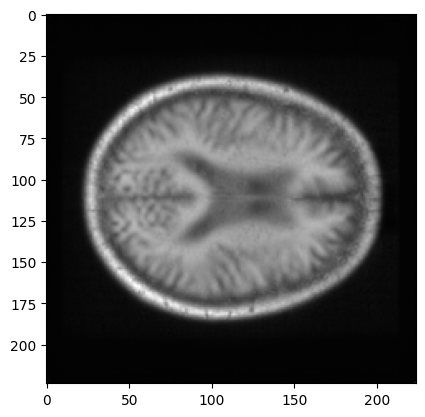

In [6]:
# Mean MRI
mean_img = np.zeros((224,224))
for i, (image_name, batch) in tqdm(enumerate(test_loader)):
    for j, (name, img) in enumerate(zip(image_name, batch)):
        mean_img += img[0].numpy().squeeze()
mean_img /= (i*batch_size + j)
plt.imshow(mean_img,cmap='gray')

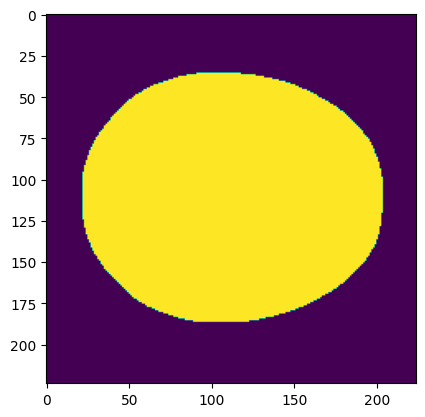

In [7]:
# Calculate the convex hull of the mean MRI with a given threshold for the pixels' intensity
ret,thresh = cv.threshold(np.array(mean_img*256, dtype=np.uint8),10,255,0)
mean_chull = convex_hull_image(thresh)
plt.imshow(mean_chull)

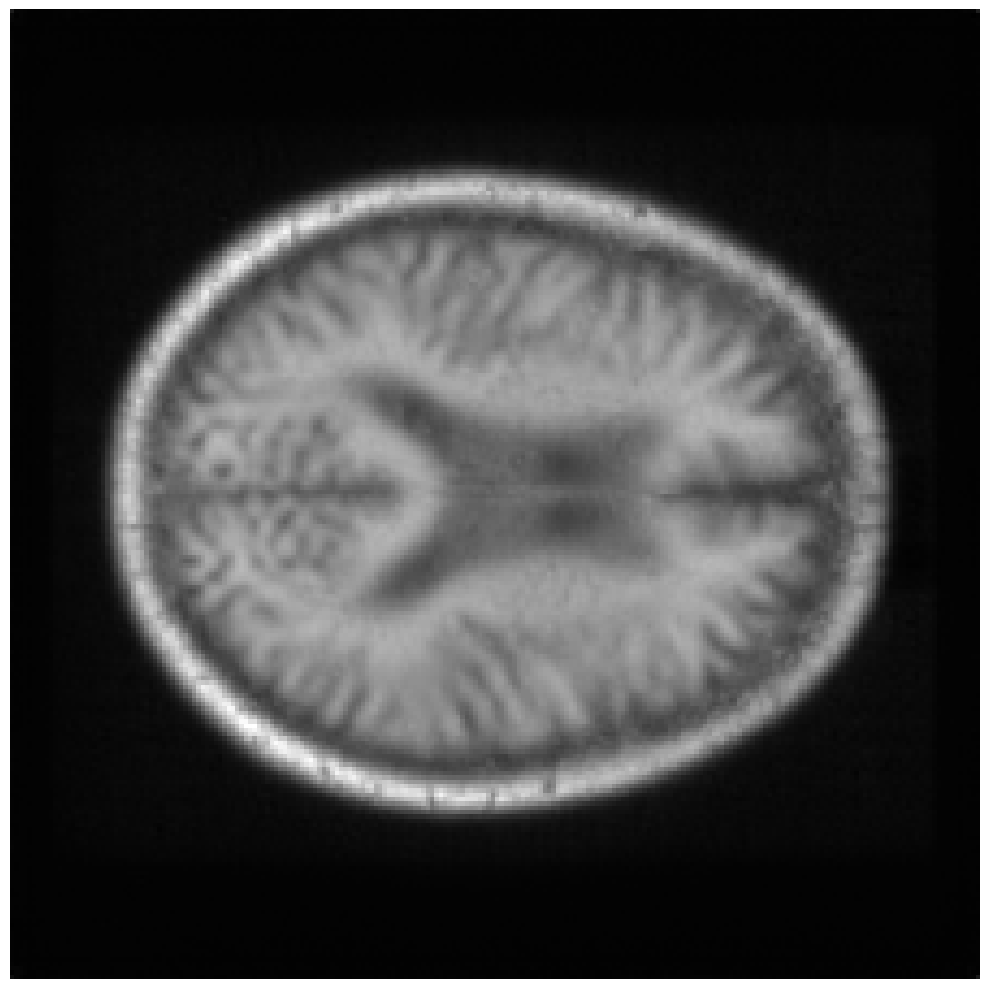

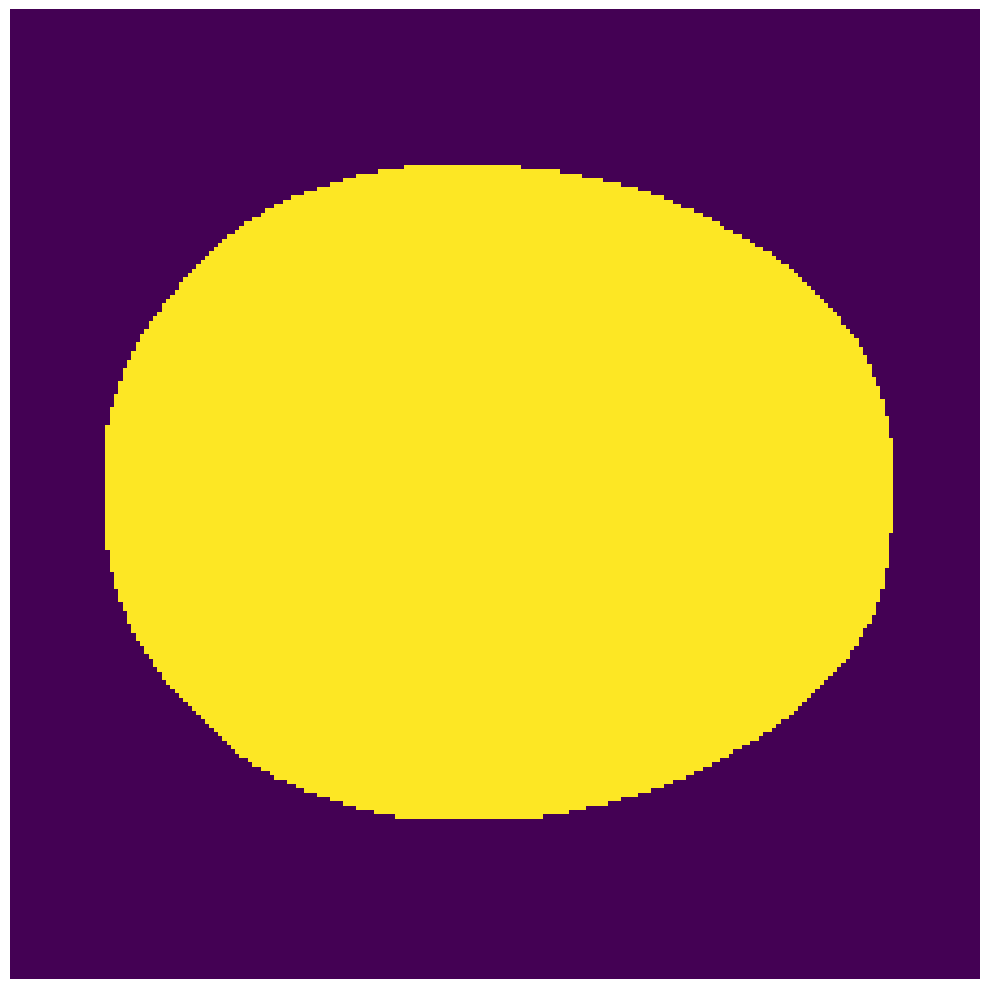

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
plt.imshow(mean_img,cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.savefig("mean_img.png")
fig, ax = plt.subplots(1, 1, figsize=(10,10))
plt.imshow(mean_chull)
plt.axis('off')
plt.tight_layout()
plt.savefig("convex_hull.png")

In [9]:
ret,thresh = cv.threshold(np.array(img.numpy()[0:1,:,:].reshape(224,224,1)*256, dtype=np.uint8),10,255,0)

In [10]:
# Remove high pixels in the edges when they appear
thresh = np.pad(thresh[10:-10,10:-10], 10, mode="minimum")
thresh.shape

(224, 224)

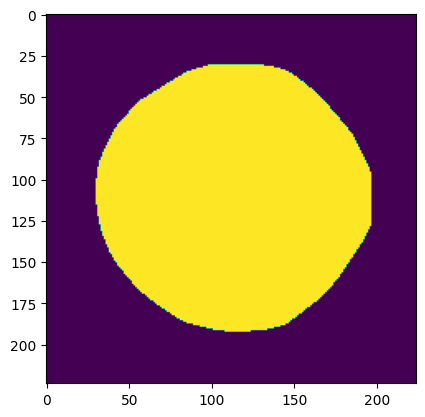

In [11]:
# Calculate the convex hull of a single image with a given threshold for the pixels' intensity
chull = convex_hull_image(thresh)
plt.imshow(chull)

In [12]:
# Get contours
contours,hierarchy = cv.findContours(np.array(chull*255, dtype=np.uint8), 1, 2)
cnt = contours[0]
M = cv.moments(cnt)
print( M )
epsilon = 0.1*cv.arcLength(cnt,True)
approx = cv.approxPolyDP(cnt,epsilon,True)

{'m00': 20738.0, 'm10': 2344669.333333333, 'm01': 2298351.1666666665, 'm20': 300171399.3333333, 'm11': 260047826.25, 'm02': 288162015.8333333, 'm30': 41859525748.600006, 'm21': 33298704464.149998, 'm12': 32633867457.783333, 'm03': 39360715287.450005, 'mu20': 35079573.5703004, 'mu11': 192801.76768630743, 'mu02': 33440341.355658174, 'mu30': -10600373.205757141, 'mu21': -12289780.326111794, 'mu12': 11102779.833413124, 'mu03': 12041335.449951172, 'nu20': 0.08156814111485157, 'nu11': 0.0004483088074692033, 'nu02': 0.07775654618950302, 'nu30': -0.0001711606709781089, 'nu21': -0.00019843896115359557, 'nu12': 0.00017927286229668852, 'nu03': 0.0001944274050621902}


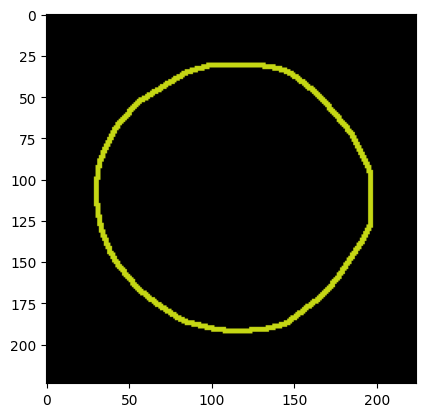

In [13]:
import random
# Draw contours
drawing = np.zeros((img.shape[1], img.shape[2], 3), dtype=np.uint8)
for i in range(len(contours)):
    color = (random.randint(0,256), random.randint(0,256), random.randint(0,256))
    cv.drawContours(drawing, contours, i, color, 2, cv.LINE_8, hierarchy, 0)
    break
# Show in a window
plt.imshow(drawing)

In [14]:
#Percent of the image that the convex hull occupies
np.where(chull==True)[0].shape[0]/(chull.shape[0]*chull.shape[1])

0.4178491709183674

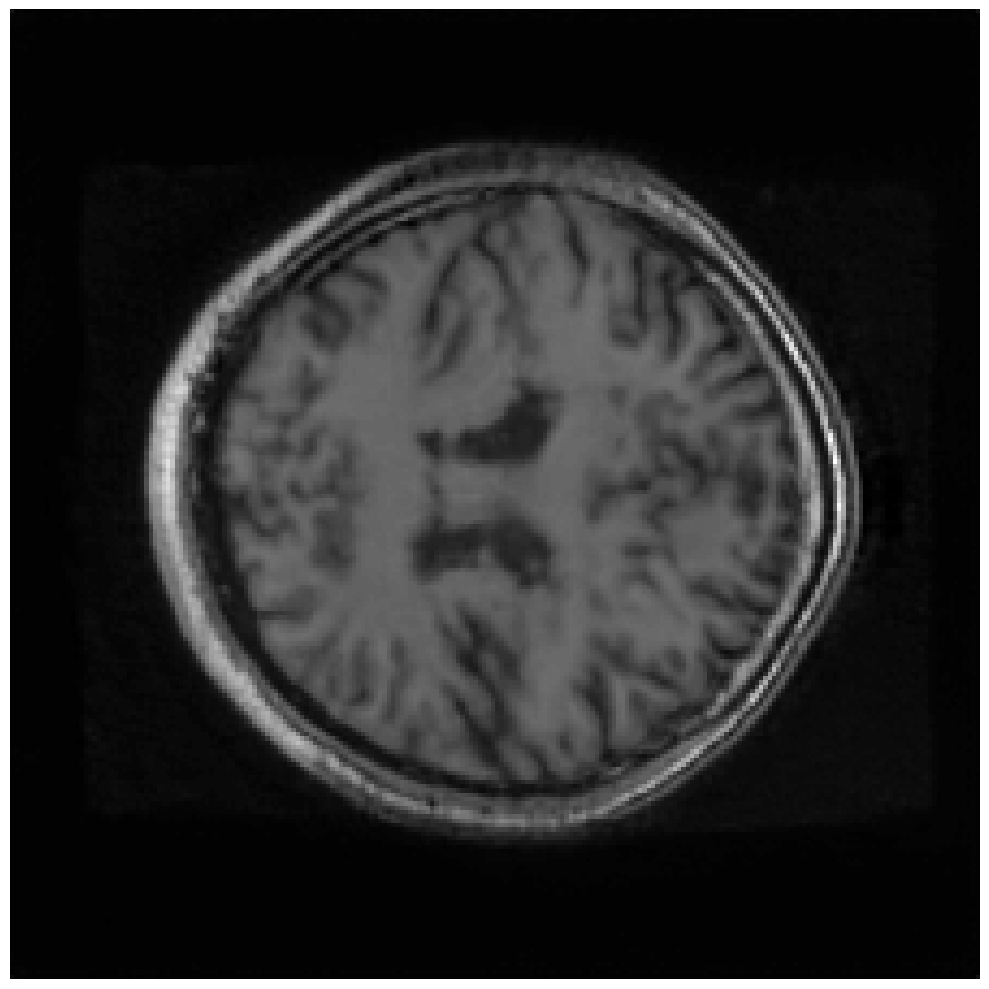

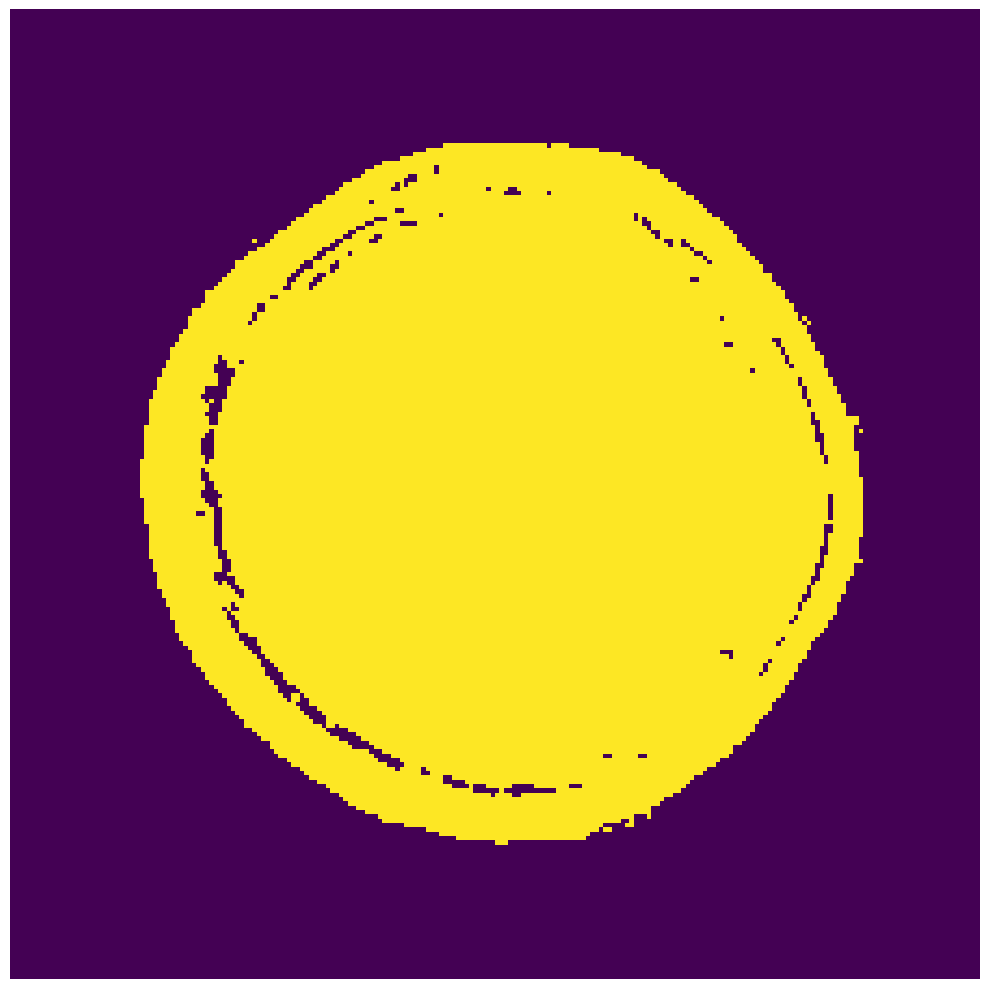

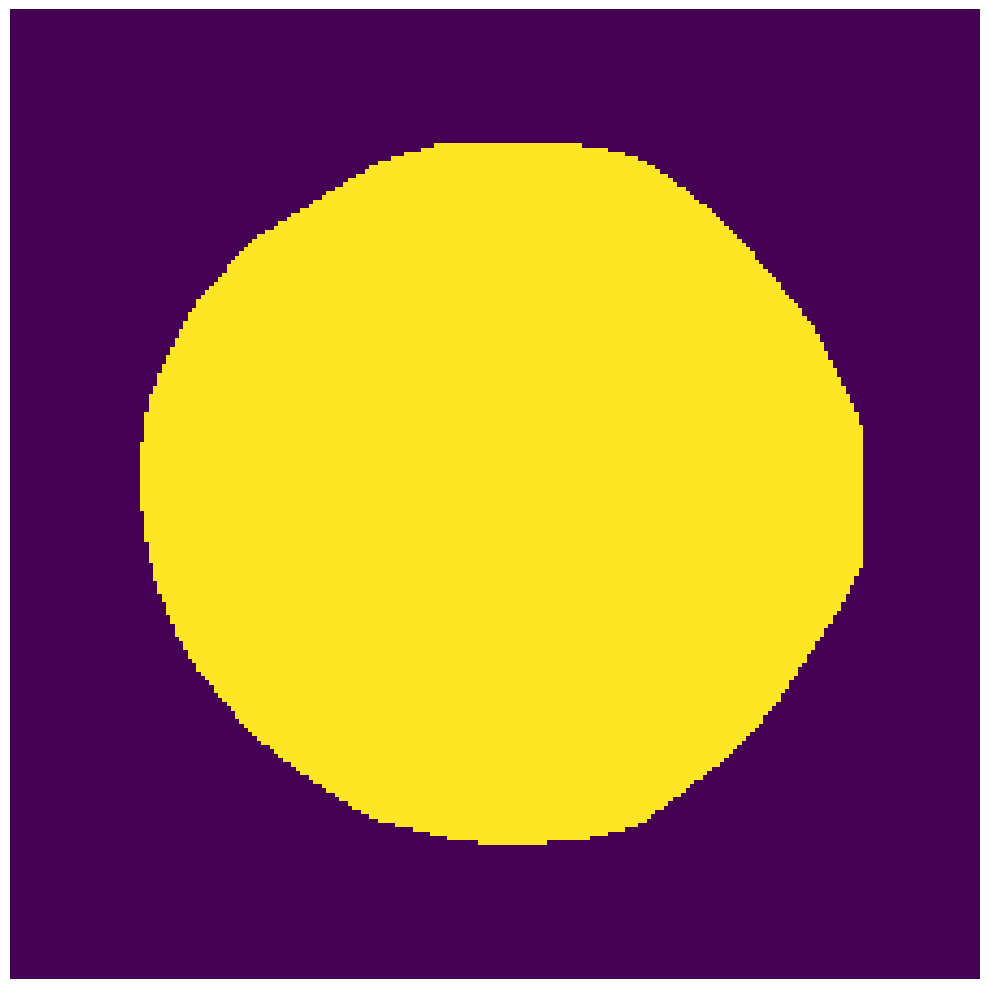

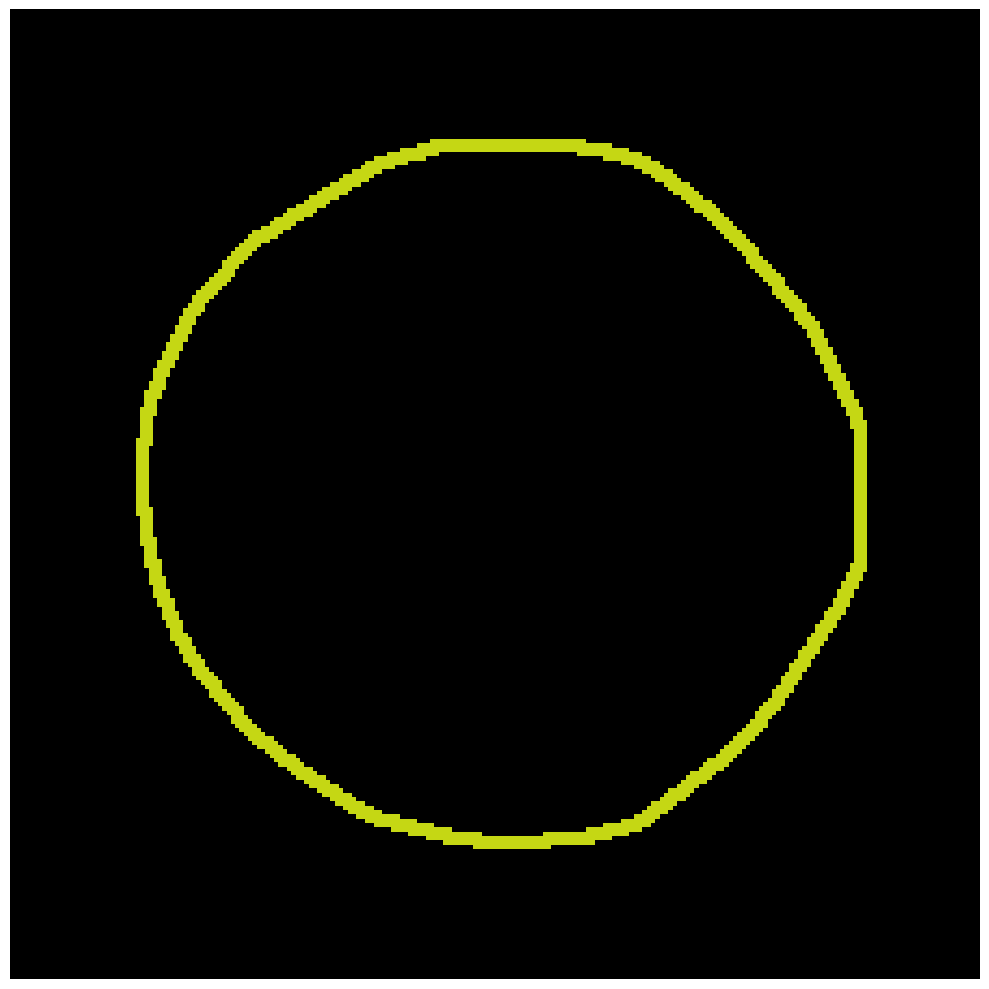

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
plt.imshow(np.array(img.numpy()[0:1,:,:].reshape(224,224,1)*256, dtype=np.uint8), cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.savefig("dubious_brain.png")
fig, ax = plt.subplots(1, 1, figsize=(10,10))
plt.imshow(thresh)
plt.axis('off')
plt.tight_layout()
plt.savefig("dubious_brain_th.png")
fig, ax = plt.subplots(1, 1, figsize=(10,10))
plt.imshow(chull)
plt.axis('off')
plt.tight_layout()
plt.savefig("dubious_brain_chull.png")
fig, ax = plt.subplots(1, 1, figsize=(10,10))
plt.imshow(drawing)
plt.axis('off')
plt.tight_layout()
plt.savefig("dubious_brain_contour.png")

In [16]:
rect = cv.minAreaRect(cnt)
box = cv.boxPoints(rect)
box = np.intp(box)

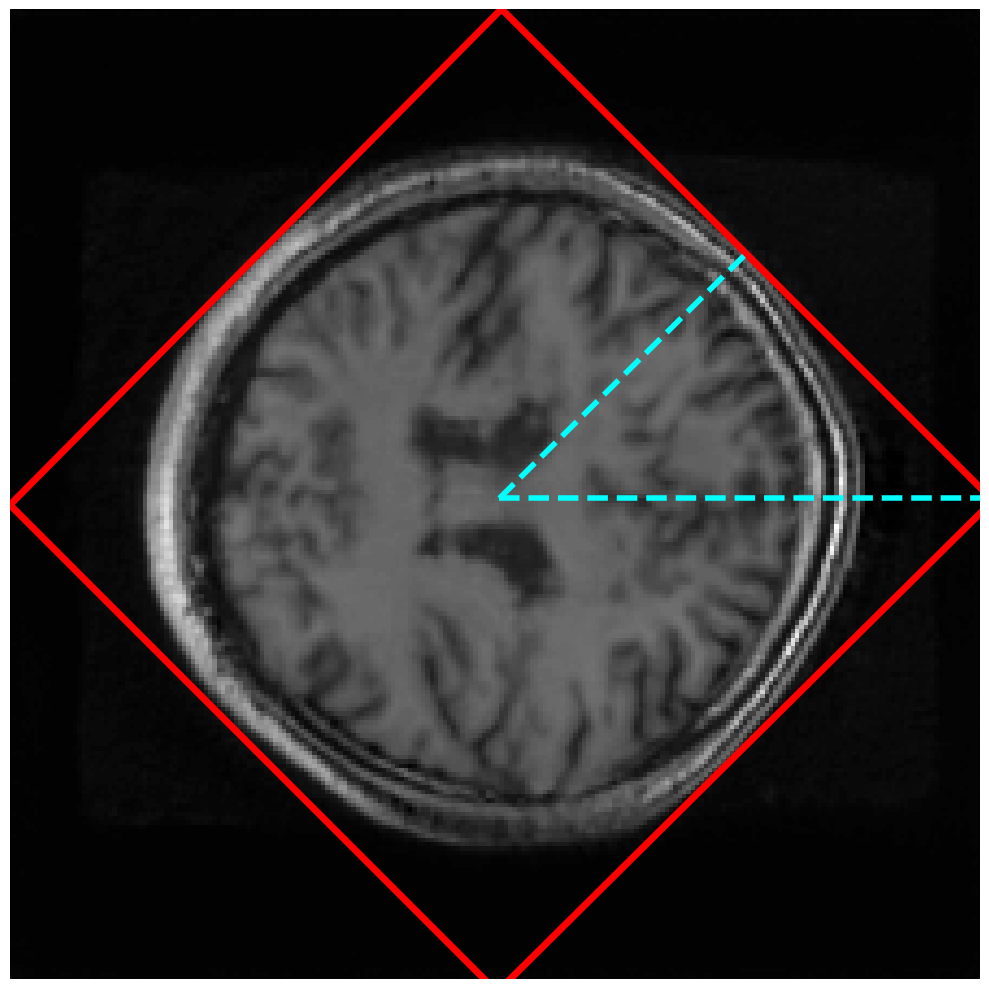

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
ax.imshow(np.array(img.numpy()[0:1,:,:].reshape(224,224,1)*256, dtype=np.uint8), cmap='gray')
ax.plot((box[0][0], box[1][0]), (box[0][1], box[1][1]), c='red', linewidth=5.0)
ax.plot((box[1][0], box[2][0]), (box[1][1], box[2][1]), c='red', linewidth=5.0)
ax.plot((box[2][0], box[3][0]), (box[2][1], box[3][1]), c='red', linewidth=5.0)
ax.plot((box[3][0], box[0][0]), (box[3][1], box[0][1]), c='red', linewidth=5.0)
ax.plot((rect[0][0], rect[0][0]+rect[1][0]/2*np.sqrt(2)), (rect[0][1], rect[0][1]), c='cyan', linewidth=4.0, linestyle='--')
ax.plot((rect[0][0], rect[0][0]+rect[1][0]/4*np.sqrt(2)), (rect[0][1], rect[0][1]+rect[1][1]/4*np.sqrt(2)), c='cyan', linewidth=4.0, linestyle='--')
ax.axis('off')
ax.set_xlim(0,223)
ax.set_ylim(0,223)
plt.tight_layout()
plt.savefig("dubious_brain_ircumscribed_rect.png")

In [18]:
#percent of the image that the min circumscribed rectagle occupies
rect[1][0]*rect[1][0]/(chull.shape[0]*chull.shape[1])

0.5180165225343556

In [19]:
#Rotation of the circumscribed min rectangle
rect[2]

45.0

In [20]:
#perimeter
perimeter = cv.arcLength(cnt,True)
perimeter

536.8427075147629

In [21]:
#centroid
center = [ np.average(indices) for indices in np.where(chull == True) ]
center

[110.82691023561958, 113.05690165029095]

In [22]:
center_m = [ np.average(indices) for indices in np.where(mean_chull == True) ]
center_m

[111.00889270076287, 111.50340811628222]

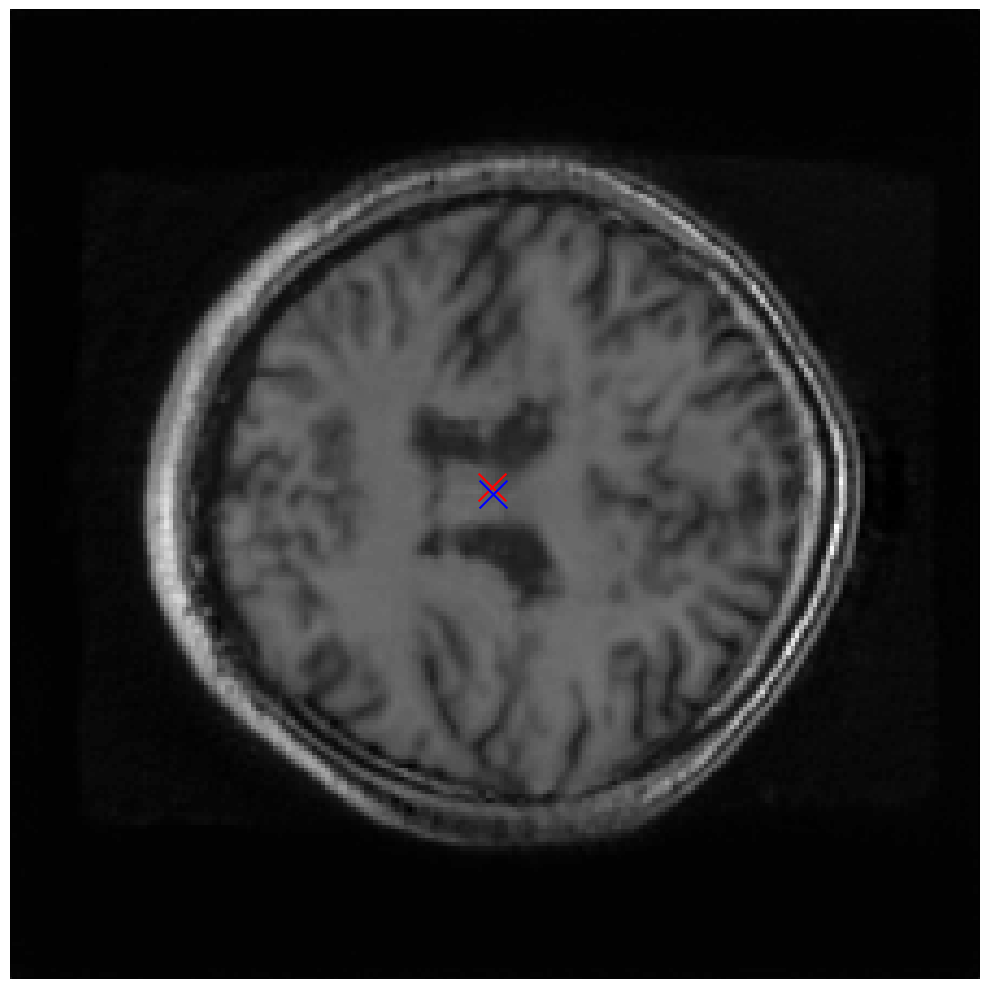

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
ax.imshow(np.array(img.numpy()[0:1,:,:].reshape(224,224,1)*256, dtype=np.uint8), cmap='gray')
ax.scatter(center[0], center[1], s=400, c='r', marker='x')
ax.scatter(center_m[0], center_m[1], s=400, c='b', marker='x')
ax.axis('off')
ax.set_xlim(0,223)
ax.set_ylim(0,223)
plt.tight_layout()
plt.savefig("dubious_brain_dist_centroid.png")

In [24]:
# % of intersecting pixels convex hull with the mean convex hull
mean_chull[(mean_chull==chull) & (mean_chull==True)].shape[0]/mean_chull[mean_chull==True].shape[0]

0.9099444770459982

In [25]:
# % of intersecting pixels of the convex hull background with the mean background of the convex hull
mean_chull[(mean_chull==chull) & (mean_chull==False)].shape[0]/mean_chull[mean_chull==False].shape[0]

0.971166541769261

In [26]:
labels = dip.Label(chull*1 > 0)
msr = dip.MeasurementTool.Measure(labels, features=["Roundness", "Circularity"])
print(msr)

Circularity = msr[1]["Roundness"][0]

  |  Roundness | Circularity |  SolidArea |  Perimeter | 
- | ---------- | ----------- | ---------- | ---------- | 
  |            |             |            |            | 
  |            |             |      (px²) |       (px) | 
- | ---------- | ----------- | ---------- | ---------- | 
1 |     0.9952 |     0.01643 |  2.097e+04 |      514.5 | 



### 2.1.2. Final feature engineering
The features engineered that will be used for one-class classification are:
 - 'brain_area'
 - 'circumscribed_rectangle_orientation'
 - 'perimeter'
 - 'centroid_x'
 - 'centroid_y' 
 - 'intersecting_chull'
 - 'intersecting_chull_background'
 - 'circularity'

In [27]:
def normalize_region(img, mask):
    img = img.squeeze()
    normalized = np.array(np.clip((img - img.min())/(img.max() - img.min())*255,0,255),dtype=np.uint8)
    return np.where(mask==False, np.array(img, dtype=np.uint8), normalized)
    
def feature_engineering(img, mean_chull_threshold, image_name):
    features = {}
    features['image_name'] = image_name
    # Normalize the image only on the region of the brain in the mean_chull_threhold.
    # It is done because sometimes the images have a noisy background immitating ATLAS
    # and the intensity of the noisy pixels sometimes is relatively high, compared to other images.
    # As we want to filter out strage shapes and not noisy background that immitates ATLAS, if we
    # do not follow the next step sometimes the individual convex hull includes an area in the background
    # and the image would be considered as anomay just because it has a noisy background.
    img = np.array(img.numpy()[0:1,:,:].reshape(224,224,1)*256, dtype=np.uint8)
    img = normalize_region(img, mean_chull_threshold)
    # Get the threshold of the image
    _,thresh = cv.threshold(img, 20,255,0)
    # Remove high pixels in the edges when they appear
    thresh = np.pad(thresh[10:-10,10:-10], 10, mode="minimum")
    # Calculate the convex hull
    chull = convex_hull_image(thresh)
    # Get the contour 
    contours, _ = cv.findContours(np.array(chull*255, dtype=np.uint8), 1, 2)
    cnt = contours[0]
    # Calculate the rate of the image that the convex hull occupies
    features['brain_area'] = np.where(chull==True)[0].shape[0]/(chull.shape[0]*chull.shape[1])
    # Calculate the rotation of the minimum circumscribed rectangle
    rect = cv.minAreaRect(cnt)
    features['circumscribed_rectangle_orientation'] = rect[2]
    # Calculate perimeter
    features['perimeter'] = cv.arcLength(cnt,True)
    # Calculate centroid
    center = [ np.average(indices) for indices in np.where(chull == True) ]
    features['centroid_x'] = center[0]
    features['centroid_y'] = center[1]
    # Calculate rate of intersecting pixels convex hull with the mean convex hull
    features['intersecting_chull'] = mean_chull_threshold[(mean_chull_threshold==chull) & (mean_chull_threshold==True)].shape[0]/mean_chull_threshold[mean_chull_threshold==True].shape[0]
    # Calculate rate of intersecting pixels of the convex hull background with the mean background of the convex hull
    features['intersecting_chull_background'] =  mean_chull_threshold[(mean_chull_threshold==chull) & (mean_chull_threshold==False)].shape[0]/mean_chull_threshold[mean_chull==False].shape[0]
    # Calculate the circularity
    labels = dip.Label(chull*1 > 0)
    msr = dip.MeasurementTool.Measure(labels, features=["Circularity"])
    features['circularity'] = msr[1]["Circularity"][0]
    return features
    

After defining the features to be engineered the next step is to extract these features from the synthetic images and store this information in a Pandas DataFrame. Then, this DataFrame will be used to train/test the one-class classifiers. 

In [ ]:
all_results = {'image_name': [], 'brain_area': [], 'circumscribed_rectangle_orientation': [], 'perimeter': [],
               'centroid_x': [], 'centroid_y': [], 'intersecting_chull': [], 'intersecting_chull_background': [],
               'circularity': []
               }
failed_images = []
break_sign=False
for i, (image_name, batch) in tqdm(enumerate(test_loader)):
    for j, (name, img) in enumerate(zip(image_name, batch)):
        try:
            features = feature_engineering(img, mean_chull, name)
            for key in features.keys():
                all_results[key].append(features[key])
        except:
            failed_images.append(name)
    if break_sign:
        break
print(f"Failed images: {failed_images}")

1250it [01:10, 17.74it/s]

Failed images: []


In [29]:
df = pd.DataFrame.from_dict(all_results)
df.head()

,image_name,brain_area,circumscribed_rectangle_orientation,perimeter,centroid_x,centroid_y,intersecting_chull,intersecting_chull_background,circularity
0,0.tiff,0.410196,71.565048,537.872146,111.069575,111.418764,0.929084,1.000000,0.065146
1,1.tiff,0.432338,90.000000,549.629506,111.310515,111.170331,0.974992,0.996646,0.062212
2,10.tiff,0.424247,90.000000,550.901585,111.453892,111.239536,0.959960,0.999251,0.081592
3,100.tiff,0.423430,90.000000,543.629506,110.686529,111.274781,0.959057,1.000000,0.060603
4,1000.tiff,0.439892,90.000000,555.043718,110.836807,111.170397,0.991875,0.996467,0.070433


In [30]:
df.columns

Index(['image_name', 'brain_area', 'circumscribed_rectangle_orientation',
       'perimeter', 'centroid_x', 'centroid_y', 'intersecting_chull',
       'intersecting_chull_background', 'circularity'],
      dtype='object')

## 2.2. One-class classification with features engineered before the filtration of US

In [31]:
scaler = StandardScaler()
df_transformed = df.copy()
df_transformed[['brain_area', 'circumscribed_rectangle_orientation',
       'perimeter', 'centroid_x', 'centroid_y', 'intersecting_chull',
       'intersecting_chull_background', 'circularity']] = scaler.fit_transform(df[['brain_area', 'circumscribed_rectangle_orientation',
       'perimeter', 'centroid_x', 'centroid_y', 'intersecting_chull',
       'intersecting_chull_background', 'circularity']])
df_transformed.head()

,image_name,brain_area,circumscribed_rectangle_orientation,perimeter,centroid_x,centroid_y,intersecting_chull,intersecting_chull_background,circularity
0,0.tiff,-1.198415,-0.755180,-0.997266,-0.071450,-0.040002,-1.559352,0.264547,-0.324919
1,1.tiff,0.008738,0.290046,-0.120398,0.286586,-0.208820,0.217254,0.146313,-0.593536
2,10.tiff,-0.432400,0.290046,-0.025525,0.499645,-0.161793,-0.364467,0.238133,1.180691
3,100.tiff,-0.476948,0.290046,-0.567880,-0.640658,-0.137843,-0.399405,0.264547,-0.740835
4,1000.tiff,0.420539,0.290046,0.283397,-0.417345,-0.208775,0.870598,0.140024,0.159119


#### 2.2.1. Isolation forest

In [32]:
OneClass_Isolation_forest_classifier = IsolationForest(random_state=random_state).fit(df_transformed[['brain_area', 'circumscribed_rectangle_orientation',
       'perimeter', 'centroid_x', 'centroid_y', 'intersecting_chull',
       'intersecting_chull_background', 'circularity']])

In [33]:
test_prediction_iso = OneClass_Isolation_forest_classifier.predict(df_transformed[['brain_area', 'circumscribed_rectangle_orientation',
       'perimeter', 'centroid_x', 'centroid_y', 'intersecting_chull',
       'intersecting_chull_background', 'circularity']])
np.unique(test_prediction_iso, return_counts=True)

(array([-1,  1]), array([1061, 8939]))

In [34]:
df_transformed['prediction_isolation_forest'] = test_prediction_iso
faulty_isolation_forest = df_transformed[df_transformed['prediction_isolation_forest']==-1]

24it [00:00, 741.56it/s]


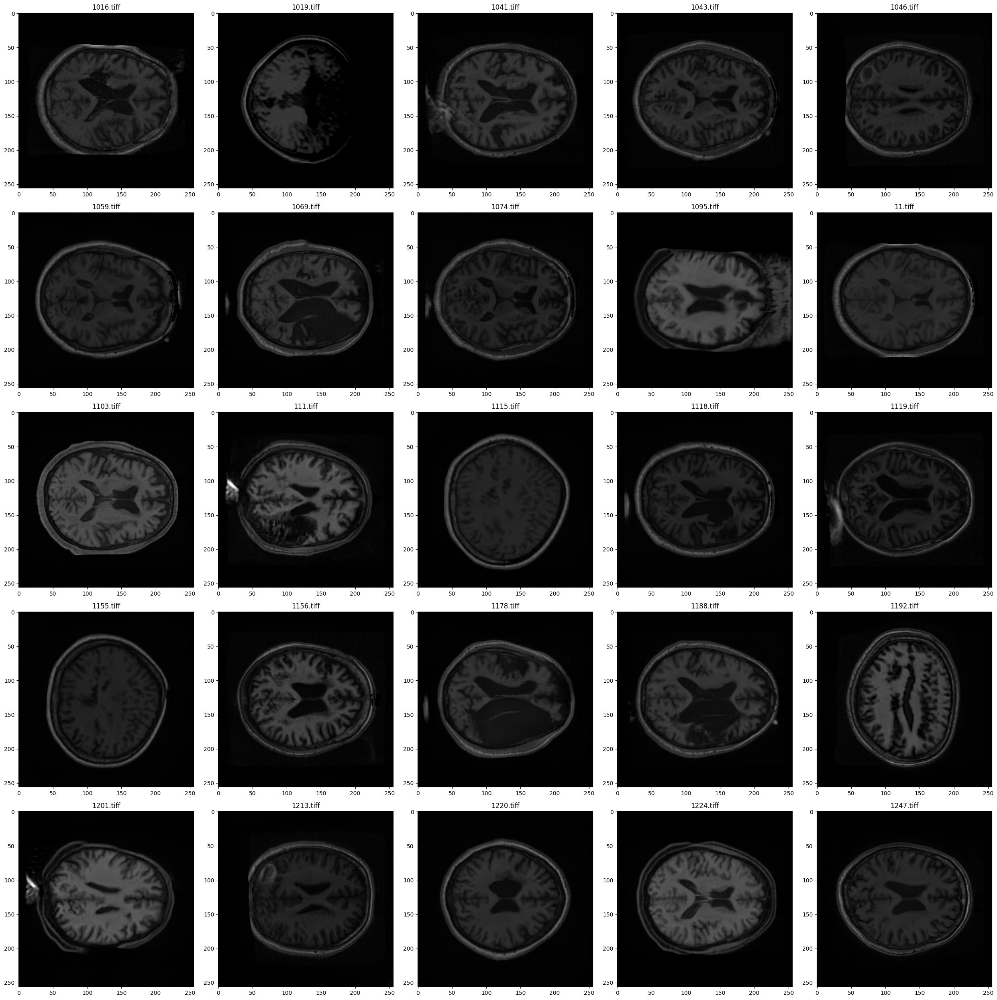

In [35]:
fig, ax = plt.subplots(5, 5, figsize=(5*5, 5*5)) #400 images
x,y = 0,0
for i, row in tqdm(faulty_isolation_forest.iterrows()):
    folder = os.path.join(data_dir, TEST)
    img = Image.open(os.path.join(folder, row['image_name']))
    ax[x,y].imshow(img)
    ax[x,y].set_title(f"{row['image_name']}")
    y+=1
    if y>=5:
        y=0
        x+=1
        if x==5:
            break
plt.tight_layout()
plt.savefig('Bad_images_one_class_classification_feature_engineering_isolation.png')

It looks good!

# 3. Combining a high uncertainty score filter with the anomaly detection
As described above, the anomaly detection does not deal with the quality of the segmentations automatically generated by DataseGAN-2-ADA. For this reason, we will use one-class classification to remove low quality synthetic images and the uncertainty score to remove low quality synthetic masks.

## 3.1. Loading the uncertainty score metrics

In [ ]:
uncertainty_metrics = pickle.load(open('./datasets/synthetic_ATLAS_2_0_layers/synthetic_with_metadata/10000_0_only_uncertainty_scores.pickle','rb'))
uncertainty_metrics[0]

{'latent': array([[ 1.76405235,  0.40015721,  0.97873798,  2.2408932 ,  1.86755799,
         -0.97727788,  0.95008842, -0.15135721, -0.10321885,  0.4105985 ,
          0.14404357,  1.45427351,  0.76103773,  0.12167502,  0.44386323,
          0.33367433,  1.49407907, -0.20515826,  0.3130677 , -0.85409574,
         -2.55298982,  0.6536186 ,  0.8644362 , -0.74216502,  2.26975462,
         -1.45436567,  0.04575852, -0.18718385,  1.53277921,  1.46935877,
          0.15494743,  0.37816252, -0.88778575, -1.98079647, -0.34791215,
          0.15634897,  1.23029068,  1.20237985, -0.38732682, -0.30230275,
         -1.04855297, -1.42001794, -1.70627019,  1.9507754 , -0.50965218,
         -0.4380743 , -1.25279536,  0.77749036, -1.61389785, -0.21274028,
         -0.89546656,  0.3869025 , -0.51080514, -1.18063218, -0.02818223,
          0.42833187,  0.06651722,  0.3024719 , -0.63432209, -0.36274117,
         -0.67246045, -0.35955316, -0.81314628, -1.7262826 ,  0.17742614,
         -0.40178094, -1.630

In [ ]:
df_transformed['uncertainty_score'] = np.nan
df_transformed['lesion_area'] = np.nan
df_transformed['lesion_pixels'] = np.nan
df_transformed['uncertainty_score_v2'] = np.nan
for metrics in tqdm(uncertainty_metrics):
    image_name = metrics['image_name'].split('/')[-1]
    uncertainty_score = metrics['uncertrainty_score']
    idx = df_transformed[df_transformed['image_name']==image_name].index.values[0]
    df_transformed.at[idx, 'uncertainty_score']  = float(uncertainty_score)
    mask = np.load(os.path.join('./datasets/synthetic_ATLAS_2_0_layers/synthetic_with_metadata/', 'label_'+df_transformed['image_name'][idx].replace('.tiff','.npy')))
    df_transformed.at[idx, 'lesion_area'] = len(np.where(mask==1)[0])/np.prod(mask.shape)
    df_transformed.at[idx, 'lesion_pixels'] = len(np.where(mask==1)[0])

100%|██████████| 10000/10000 [00:08<00:00, 1143.16it/s]


### 3.1.1. Applying a correction to the uncertainty score

We observed that the uncertainty of the pixels tends to be higher in regions around the lesions. As sometimes the region of the lesion corresponds to much less than 10% of image pixels, images with bigger lesions tend to have a higher uncertainty score,. This way, choosing a constant uncertainty score threshold to filter out poor image segmentation tends to be complacent with images containing small portions of the lesion class segmented with low quality and filter out images with big lesions for which the segmentation is acceptable. To solve this problem, we empirically derived a heuristic formulation for computing the bias of the uncertainty score.

In [38]:
df_transformed['uncertainty_score_v2'] = (
                                        np.maximum(0, df_transformed['uncertainty_score'] - 0.15*(df_transformed['lesion_area'])**0.5)
                                        )
US_th = 0.035
print(len(df_transformed[df_transformed['uncertainty_score_v2']>=US_th]))

1188


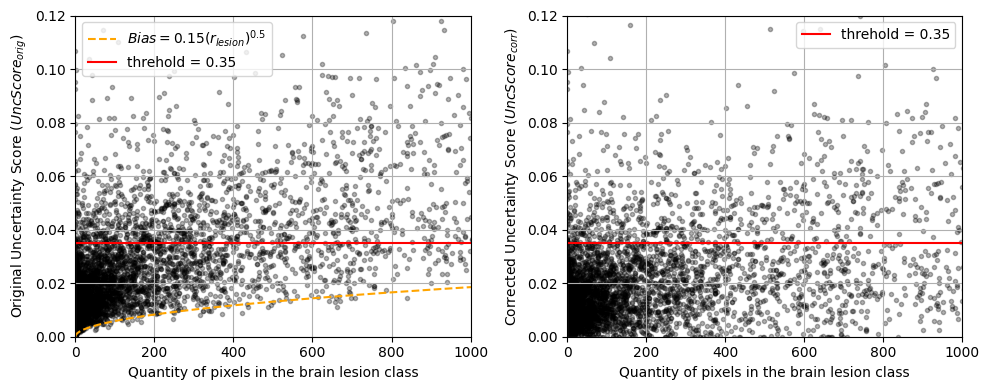

In [39]:
fig, ax = plt.subplots(1,2, figsize=(10, 4))
ax[0].scatter(df_transformed['lesion_pixels'], df_transformed['uncertainty_score'], marker='.', alpha=0.3, c='black')
ax[1].scatter(df_transformed['lesion_pixels'], df_transformed['uncertainty_score_v2'], marker='.', alpha=0.3, c='black')
vals = np.array([i for i in range(9000)])
vals_y = 0.15*(vals/256/256)**0.5 + US_th
vals_y1 = vals*0.5 
vals_y2 = (5-3.5*vals**0.125)
ax[1].plot(vals, [US_th for i in range(len(vals))], color='red', linestyle='-', label= r'threhold = 0.35')
ax[0].plot(vals, vals_y - [US_th for i in range(len(vals))], color='orange', linestyle='--', label= r'$Bias = 0.15(r_{lesion})^{0.5}$')
ax[0].plot(vals, [US_th for i in range(len(vals))], color='red', linestyle='-', label=r'threhold = 0.35')
ax[0].set_ylabel(r"Original Uncertainty Score ($UncScore_{orig}$)")
ax[1].set_ylabel(r"Corrected Uncertainty Score ($UncScore_{corr}$)")
for i in [0,1]:
    ax[i].set_xlim(0,1000)
    ax[i].set_ylim(0,0.12)
    ax[i].grid()
    ax[i].set_xlabel("Quantity of pixels in the brain lesion class")
    ax[i].legend()
plt.tight_layout()
plt.savefig("corrected_us_scatter.png")
#ax[1].grid()

In [40]:
df_transformed.head()

,image_name,brain_area,circumscribed_rectangle_orientation,perimeter,centroid_x,centroid_y,intersecting_chull,intersecting_chull_background,circularity,prediction_isolation_forest,uncertainty_score,lesion_area,lesion_pixels,uncertainty_score_v2
0,0.tiff,-1.198415,-0.755180,-0.997266,-0.071450,-0.040002,-1.559352,0.264547,-0.324919,1,0.005726,0.000229,15.0,0.003457
1,1.tiff,0.008738,0.290046,-0.120398,0.286586,-0.208820,0.217254,0.146313,-0.593536,1,0.001844,0.000000,0.0,0.001844
2,10.tiff,-0.432400,0.290046,-0.025525,0.499645,-0.161793,-0.364467,0.238133,1.180691,1,0.000275,0.000000,0.0,0.000275
3,100.tiff,-0.476948,0.290046,-0.567880,-0.640658,-0.137843,-0.399405,0.264547,-0.740835,1,0.002706,0.000000,0.0,0.002706
4,1000.tiff,0.420539,0.290046,0.283397,-0.417345,-0.208775,0.870598,0.140024,0.159119,1,0.008010,0.000000,0.0,0.008010


## 3.2. Analysis of feature importance using SHAP
SHAP (SHapley Additive exPlanations)  shows how each feature affects the final prediction, using a game theoretic approach to measures each feature's contribution to the final outcome.

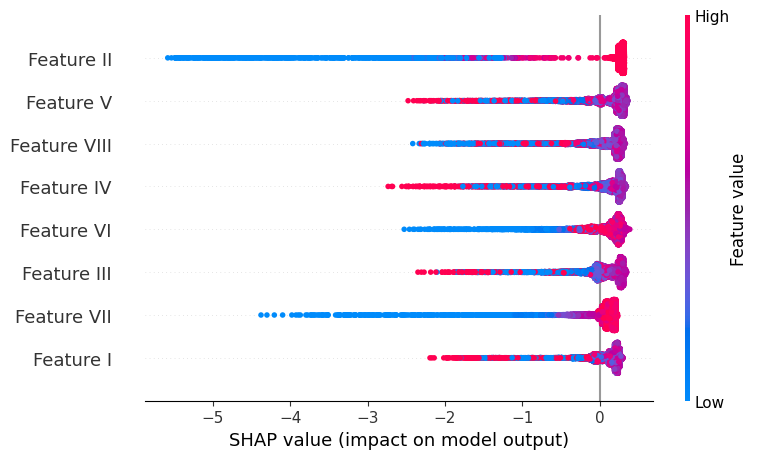

In [41]:
explainer = shap.Explainer(OneClass_Isolation_forest_classifier)
feature_list = ['brain_area', 'circumscribed_rectangle_orientation','perimeter', 'centroid_x',
                 'centroid_y', 'intersecting_chull', 'intersecting_chull_background', 'circularity']
feature_names = ["Feature I", "Feature II", "Feature III", "Feature IV", "Feature V", 
                 "Feature VI", "Feature VII",
                 "Feature VIII"]
rename_dict = {l:r for l, r in zip(feature_list, feature_names)}
df_renamed = df_transformed[feature_list].rename(columns=rename_dict)
shap_values = explainer.shap_values(df_renamed)
shap.summary_plot(shap_values, df_renamed)

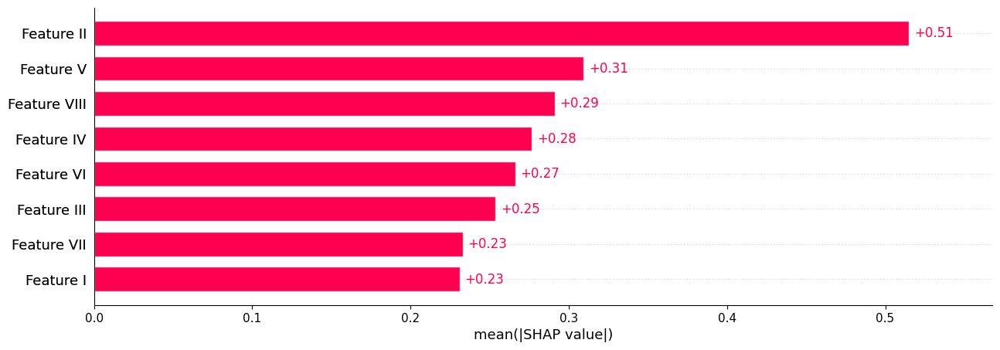

<Figure size 640x480 with 0 Axes>

In [42]:
fig, ax = plt.subplots(1,1,figsize=(15,5))
explainer = shap.Explainer(OneClass_Isolation_forest_classifier)
shap_values = explainer(df_renamed)
shap.plots.bar(shap_values, ax=ax)
plt.savefig("SHAP_metrics.png")

In [43]:
all_results = None
for feature in feature_list:
    reduced_feature_list = feature_list[:]
    reduced_feature_list.remove(feature)
    OneClass_classifier_feature_imapact = IsolationForest(random_state=random_state).fit(df_transformed[reduced_feature_list])
    result = OneClass_classifier_feature_imapact.predict(df_transformed[reduced_feature_list])
    if all_results is None:
        all_results = result
    else:
        all_results = np.vstack([all_results, result])
all_results = np.vstack([all_results,test_prediction_iso])

In [44]:
dict_diff = {}
dict_diff_not_unique = {}
df_remove_feature = pd.DataFrame(data=all_results.T, columns=feature_list+["all_features"])
df_remove_feature["occurences"] = 0
for feature in feature_list:
    df_remove_feature["occurences"] = df_remove_feature["occurences"] + (df_remove_feature[feature]+1)/2
for feature in feature_list:
    list_modif = df_remove_feature[(df_remove_feature[feature]==1) &(df_remove_feature.all_features==-1) & (df_remove_feature.occurences==1)].index.to_list()
    dict_diff[feature] = list_modif
    not_unique_list_modif = df_remove_feature[(df_remove_feature[feature]==1) &(df_remove_feature.all_features==-1)].index.to_list()
    dict_diff_not_unique[feature] = not_unique_list_modif
    print(f"{feature}: unique contributions: {len(list_modif)}, not unique contributions: {len(not_unique_list_modif)}, number anomalies: {len(df_remove_feature[df_remove_feature[feature]==-1])}")

brain_area: unique contributions: 4, not unique contributions: 102, number anomalies: 999
circumscribed_rectangle_orientation: unique contributions: 194, not unique contributions: 297, number anomalies: 822
perimeter: unique contributions: 9, not unique contributions: 70, number anomalies: 1039
centroid_x: unique contributions: 7, not unique contributions: 34, number anomalies: 1107
centroid_y: unique contributions: 10, not unique contributions: 55, number anomalies: 1061
intersecting_chull: unique contributions: 0, not unique contributions: 74, number anomalies: 1005
intersecting_chull_background: unique contributions: 3, not unique contributions: 40, number anomalies: 1077
circularity: unique contributions: 6, not unique contributions: 116, number anomalies: 957


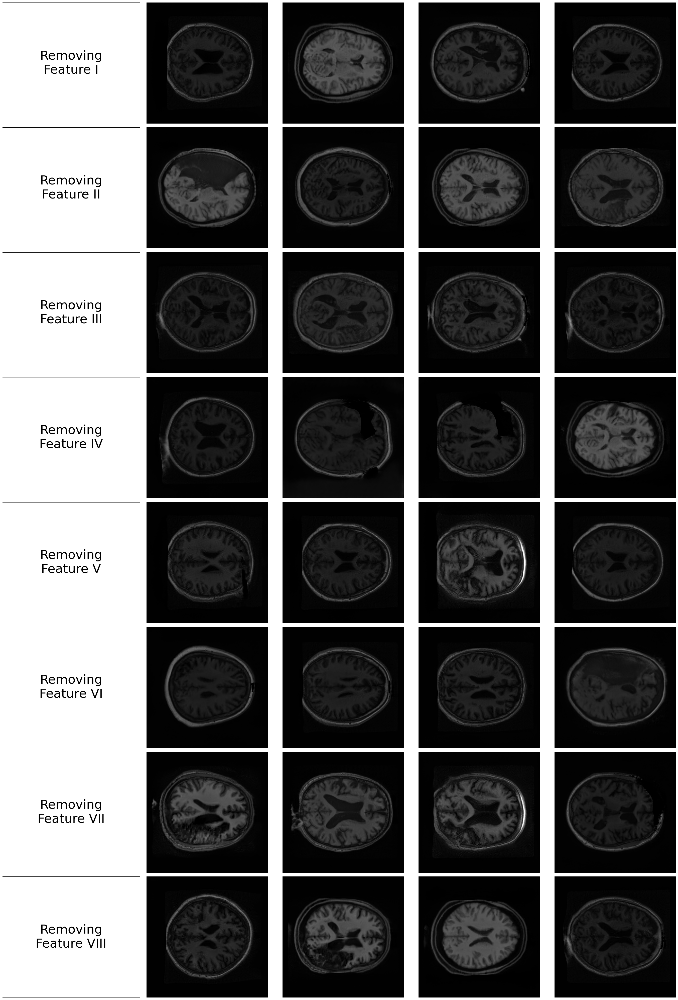

In [45]:
rows, cols = 8, 4+1
fig, ax = plt.subplots(rows, cols, figsize=(5.5*cols, rows*5))
x,y = 0,1
im_name = []
for feature, f in zip(feature_list, range(len(feature_list))):
    aux_df = df_transformed.copy()
    aux_df['shap_intensity'] = np.abs(shap_values.values[:,f])
    aux_df = aux_df[aux_df.index.isin(dict_diff_not_unique[feature])&(~aux_df.image_name.isin(im_name))&(aux_df.uncertainty_score_v2>0.032)]
    aux_df = aux_df.sort_values(by='shap_intensity', ascending=False).reset_index()
    ax[x,0].plot((0,200),(200,200), c='black', linewidth=2)
    ax[x,0].set_xlim(0,200)
    ax[x,0].set_ylim(0,200)
    ax[x,0].text(100, 100, f"Removing\n{feature_names[f]}", ha='center', va='center', size=36)
    ax[x,0].axis('off')
    for i in range(cols-1):                   
        folder = os.path.join(data_dir, TEST)
        img = Image.open(os.path.join(folder, aux_df['image_name'][i]))
        ax[x,y].imshow(img)
        ax[x,y].axis('off')
        #ax[x,y].set_title(f"{aux_df['image_name'][i]}")
        im_name.append(aux_df['image_name'][i])
        y+=1
        if y>=cols:
            y=1
            x+=1
ax[x-1,0].plot((0,200),(0,0), c='black', linewidth=2)
plt.tight_layout()
plt.savefig('Impact_of_engineered_features_qualitative.png')

## 3.3. Understand the correlation between the detected anomalies using Isolation Forest and the uncertainty score
The idea is to check whether combining these two methods to filter out anomalies will add information to our anomaly detector or not.

The histograms below show (in the left) the distribution of the uncertainty scores of the images detected as anomalies using the Isolation Forest with the engineered features, and (in the right) the distribution of the uncertainty scores of the images NOT detected as anomalies using the same method.

It is possible to observe that the images detect as anomalies with the one-class classifier tend to have higher uncertainty scores (there is a proof about this statement below). However, both anomalies and good images classified by the Isolation Forest method, have most of the images with uncertainty score < 0.1. In other words, having a low uncertainty score does not mean the image is not an anomaly.

Thus, the use of an one-class classifier combined with an uncertainty threhold filter seems to be a better approach than using only one of them.

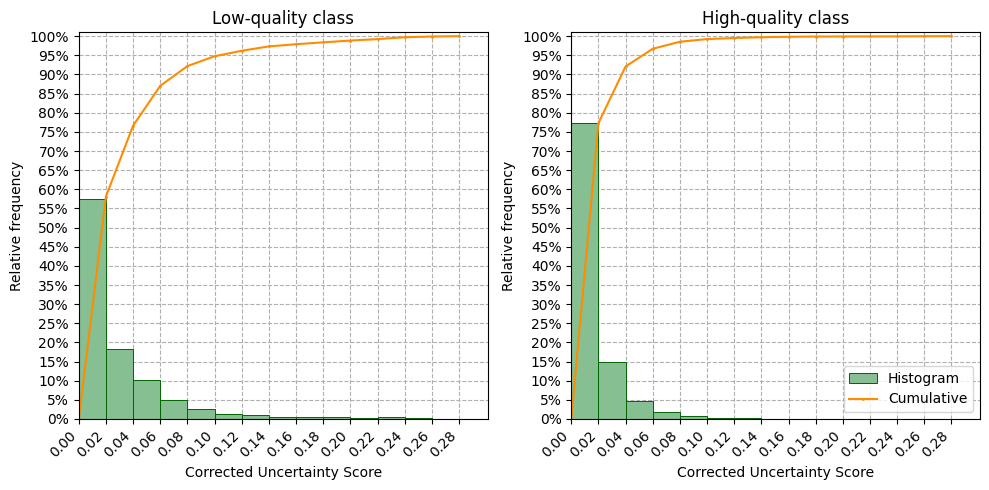

In [46]:
fig1, ax1 = plt.subplots(1,1)
plt.close()
import matplotlib.ticker as mtick
fig, ax = plt.subplots(1,2, figsize=(10,5))
bins = [i*0.02 for i in range(15)]
xticks = [i*0.02 for i in range(15)]
yticks = [i for i in range(0, 105, 5)]
df_tf_plot = df_transformed[df_transformed.prediction_isolation_forest==-1].reset_index()
df_tf_plot.plot(kind='hist', 
                column='uncertainty_score_v2', 
                bins=bins, 
                color='#86bf91', 
                zorder=2, 
                rwidth=1,
                weights=np.ones_like(df_tf_plot[df_tf_plot.columns[0]]) * 100. / len(df_tf_plot),
                xlim=(0,0.301),
                xticks=xticks,
                yticks=yticks,
                ylim=(0,101),
                edgecolor='darkgreen',
                linewidth=0.7,
                ax=ax[0],
                label="Histogram"
            )
values, base, _ = ax1.hist(df_tf_plot['uncertainty_score_v2'], bins = bins, 
                           weights=np.ones_like(df_tf_plot[df_tf_plot.columns[0]]) * 100. / len(df_tf_plot)
                           )
ax[0].plot(base, [0] + list(np.cumsum(values)/ np.cumsum(values)[-1]*100), color='darkorange', marker='o', linestyle='-', markersize = 1, label = "Cumulative" )

df_tf_plot = df_transformed[df_transformed.prediction_isolation_forest==1].reset_index()
df_tf_plot.plot(kind='hist', 
                column='uncertainty_score_v2', 
                bins=bins, 
                color='#86bf91', 
                zorder=2, 
                rwidth=1,
                weights=np.ones_like(df_tf_plot[df_tf_plot.columns[0]]) * 100. / len(df_tf_plot),
                xlim=(0,0.301),
                xticks=xticks,
                yticks=yticks,
                ylim=(0,101),
                edgecolor='darkgreen',
                linewidth=0.7,
                ax=ax[1],
                label="Histogram"
            )
values, base, _ = ax1.hist(df_tf_plot['uncertainty_score_v2'], bins = bins, 
                           weights=np.ones_like(df_tf_plot[df_tf_plot.columns[0]]) * 100. / len(df_tf_plot)
                           )
ax[1].plot(base, [0] + list(np.cumsum(values)/ np.cumsum(values)[-1]*100), color='darkorange', marker='o', linestyle='-', markersize = 1, label = "Cumulative" )
ax[0].grid(linestyle='dashed')
ax[0].set_title("Low-quality class")
ax[0].set_ylabel("Relative frequency")
ax[0].set_xlabel("Corrected Uncertainty Score")
ax[1].grid(linestyle='dashed')
ax[1].set_title("High-quality class")
ax[1].set_ylabel("Relative frequency")
ax[1].set_xlabel("Corrected Uncertainty Score")
fmt = '%.0f%%' 
yticks = mtick.FormatStrFormatter(fmt)
ax[0].yaxis.set_major_formatter(yticks)
ax[1].yaxis.set_major_formatter(yticks)
fig.autofmt_xdate(rotation=45)
ax[0].get_legend().remove()
ax[1].legend(["Histogram", "Cumulative"], loc="lower right")
plt.tight_layout()
plt.savefig("histograms_US_revised_v2.png")

### 3.3.1. Mann-Whitney U Test to evaluate if the distribution of US is different among High and Low-quality classes

The Mann-Whitney U Test was chosen because, differently from t-test, the samples do not need to obey to a normal distribution, which is the case in our experiments. In one-sided the Mann-Whitney U Test we evaluate the following hypotheses:

H0: The median of the US of the high-quality and low-quality classes are not different, meaning that the distributions are not different.

H1: The median of the US of the low-quality class is HIGHER than the median of the US of the high-quality class, meaning that the distribution of the low-quality class is more right skewed.

In [47]:
mannwhitneyu(np.array(df_transformed[df_transformed['prediction_isolation_forest']==-1]['uncertainty_score_v2']), 
             np.array(df_transformed[df_transformed['prediction_isolation_forest']==1]['uncertainty_score_v2']),
             alternative="greater",
             nan_policy='raise')

MannwhitneyuResult(statistic=5962339.0, pvalue=3.619878393320804e-43)

In [48]:
len(df_transformed[df_transformed['uncertainty_score_v2']>US_th])

1188

The p-value is very small, meaning that H0 is rejected. Thus it is considered that the median of the US of the low-quality class is HIGHER than the median of the US of the high-quality class. Threrefore, it is proven that the US tend to differ in both classes.

## 3.4. Qualitative analysis of filtering the images with high US *A POSTERIORI* of the Isolation Forest
### 3.4.1. Plot synthetic images and masks showing the uncertainty score

24it [00:00, 747.76it/s]


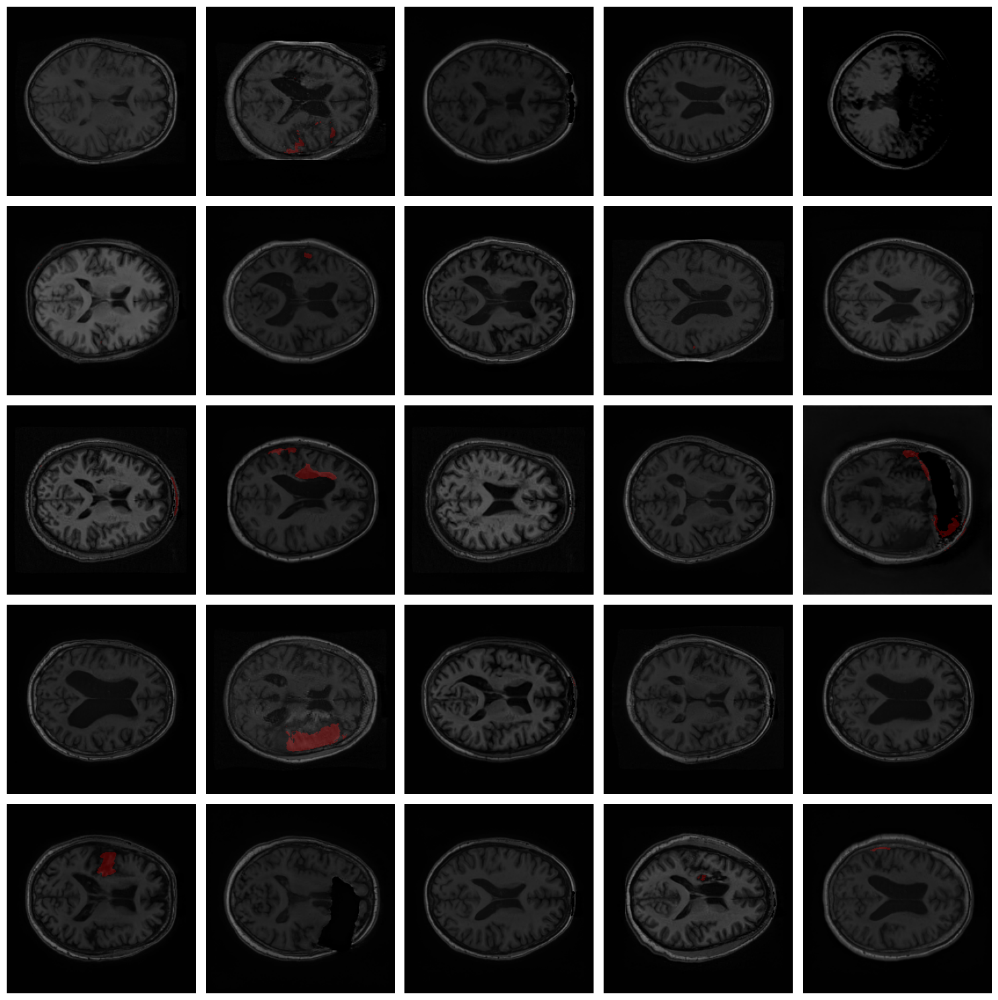

In [ ]:
fig, ax = plt.subplots(5, 5, figsize=(3*5, 3*5))
x,y = 0,0
lesion_ims=0
for i, row in tqdm(df_transformed[20:].iterrows()):
    if (row['uncertainty_score_v2']>0.035 or row['prediction_isolation_forest']==-1 or lesion_ims<10):
        folder = os.path.join(data_dir, TEST)
        img = Image.open(os.path.join('./datasets/synthetic_ATLAS_2_0_layers/synthetic_with_metadata/', 'image_and_mask_'+row['image_name'].replace('.tiff','.png')))
        ax[x,y].imshow(img)
        #ax[x,y].set_title(r'$US_{orig}$ = ' + f"{row['uncertainty_score']:.5f} \n" +r'$US_{corr}$ = ' +f"{row['uncertainty_score_v2']:.5f}")
        ax[x,y].axis('off')
        if row['uncertainty_score_v2']>0.035 or row['prediction_isolation_forest']==-1:
            lesion_ims+=1
        y+=1
        if y>=5:
            y=0
            x+=1
            if x==5:
                break
plt.tight_layout()
plt.savefig('Sample_images_us_25_imgs_revised_v2.png')

In [ ]:
#Counts of high and low-qualitry images
df_transformed['good_images'] = np.where((df_transformed['uncertainty_score_v2']<=US_th)&(df_transformed['prediction_isolation_forest']==1), True, False)
df_transformed['good_images'].value_counts()

good_images
True     8048
False    1952
Name: count, dtype: int64

### 3.4.2. Qualtitative analysis of the LOW QUALITY images filtered out
Looking to the image below, we can observe that most of the images or have poor masks, or have artifacts, or have strange shapes.

140it [00:00, 3719.89it/s]


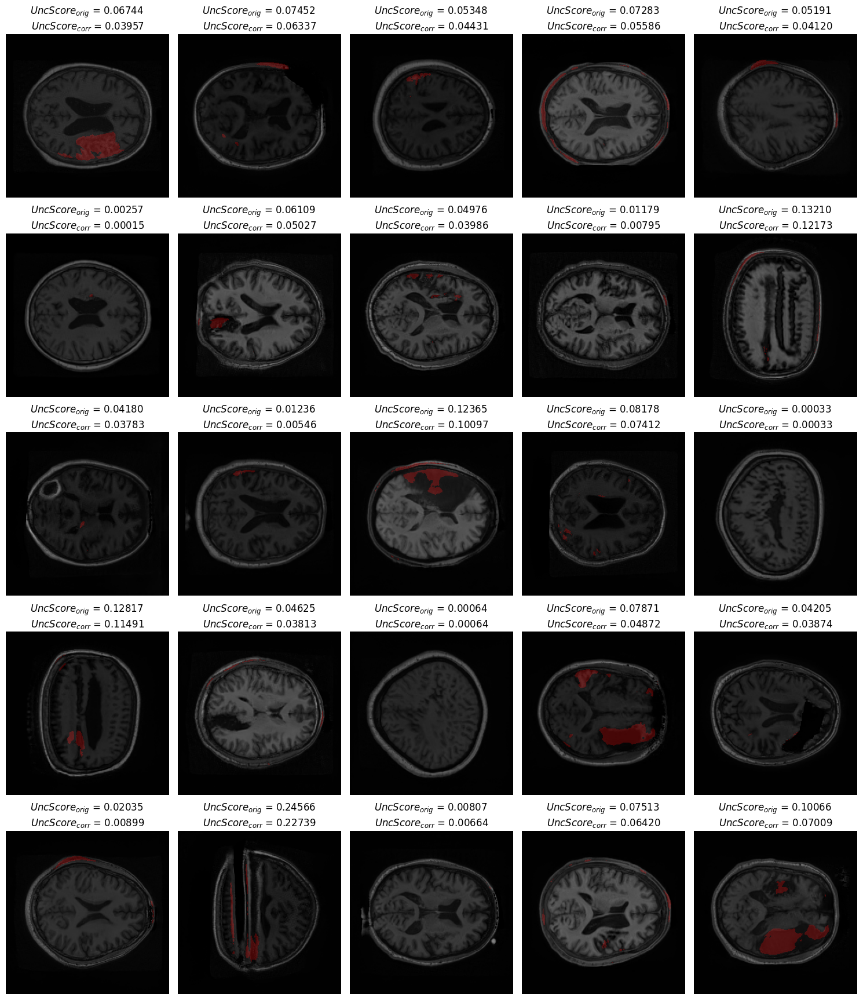

In [ ]:
fig, ax = plt.subplots(5, 5, figsize=(3*5, 3.5*5))
x,y = 0,0
for i, row in tqdm(df_transformed[7500:].iterrows()):
    folder = os.path.join(data_dir, TEST)
    if row ['good_images'] == False:
        img = Image.open(os.path.join('./datasets/synthetic_ATLAS_2_0_layers/synthetic_with_metadata/',
                                        'image_and_mask_'+row['image_name'].replace('.tiff','.png')))
        ax[x,y].imshow(img)
        string_val = "Anomalous synthesis" if row['prediction_isolation_forest'] == -1 else "Fine synthesis"
        ax[x,y].set_title(r'$UncScore_{orig}$ = ' + f"{row['uncertainty_score']:.5f} \n" +r'$UncScore_{corr}$ = ' +f"{row['uncertainty_score_v2']:.5f}")
        ax[x,y].axis('off')
        y+=1
        if y>=5:
            y=0
            x+=1
            if x==5:
                break
plt.tight_layout()
plt.savefig('Sample_bad_images_25_revised_v2.png')

### 3.4.3. Qualtitative analysis of the GOOD QUALITY images kept
Observing the image below, we do not find any images with strange shape, or with big artifacts.

Regarding the masks, not all of them look perfect, but this is something that we also observe in the real images. In general, it seems that the bigger lesions are easier to explain than the smaller ones.

35it [00:00, 1224.44it/s]


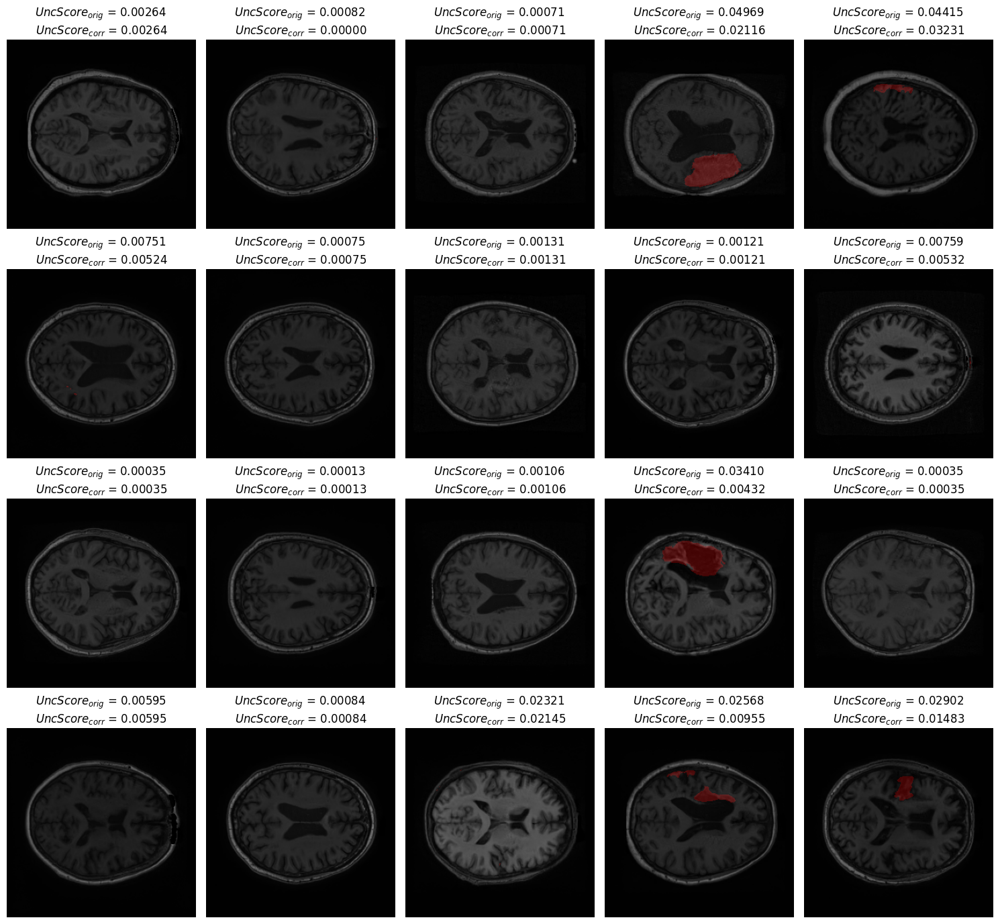

In [ ]:
fig, ax = plt.subplots(4, 5, figsize=(3*5, 3.5*4))
x,y = 0,0
lesion_ims=0
for i, row in tqdm(df_transformed[5:].iterrows()):
    folder = os.path.join(data_dir, TEST)
    if row ['good_images'] == True and (row['lesion_pixels']>200 or lesion_ims<15):
        img = Image.open(os.path.join('./datasets/synthetic_ATLAS_2_0_layers/synthetic_with_metadata/',
                                       'image_and_mask_'+row['image_name'].replace('.tiff','.png')))
        ax[x,y].imshow(img)
        string_val = "Anomalous synthesis" if row['prediction_isolation_forest'] == -1 else "Fine synthesis"
        ax[x,y].set_title(r'$UncScore_{orig}$ = ' + f"{row['uncertainty_score']:.5f} \n" +r'$UncScore_{corr}$ = ' +f"{row['uncertainty_score_v2']:.5f}")
        ax[x,y].axis('off')
        y+=1
        if row['lesion_pixels']<200 :
            lesion_ims+=1
        if y>=5:
            y=0
            x+=1
            if x==4:
                break
plt.tight_layout()
plt.savefig('Sample_good_images_20_revised_v2.png')

In [53]:
df_transformed.to_csv('sythetic_image_one-class_classification_results_revised_v2.csv', index=False)

# 4. Predict if the image quality *A PRIORI* of the image synthesis
The goal here is to use the labels corresponding to HIGH/LOW quality images generated by the one-class classifier (Isolation Forest) to classify the latent codes that generate the synthetic images. If this approach is successful it would be possible to use a latent code classifier to predict the quality outcome of latent codes before generating the images and masks. It would improve the quality of the images generated and reduce the computational cost of generating synthetic images as it would not be necessary to generate them for assessing its quality. 

## 4.1. Load the latent codes

In [ ]:
df_transformed = pd.read_csv('sythetic_image_one-class_classification_results_revised_v2.csv')
test_folder = os.path.join(data_dir, TEST) # test images
train_folder = os.path.join(data_dir, TRAIN)  # training images
base_folder = './datasets/synthetic_ATLAS_2_0_layers/synthetic_with_metadata' # all images and latents

In [55]:
with open(os.path.join(base_folder, '10000_0.pickle'), 'rb') as f:
    results = pickle.load(f)

In [56]:
results[0]['latent'].squeeze().shape

(512,)

In [57]:
if os.path.isfile('df_latents_revised_v2.csv'):
    df_latents = pd.read_csv('df_latents_revised_v2.csv')
else:
    cols = ['Y', 'image_name', 'uncertainty_score_v2'] + [f'X_{i}' for i in range(1,512+1)]
    df_latents = pd.DataFrame(columns=cols)
    count = 0
    for r in tqdm(results):
        img_name = r['image_name'].split('/')[-1]
        latent = list(r['latent'].squeeze())
        filtered = df_transformed[df_transformed['image_name']==img_name]
        us = filtered['uncertainty_score_v2'].values[0]
        y = filtered['prediction_isolation_forest'].values[0]
        if y==-1: # Adds the target value (high quality = 1, low quality = 0)
            y=0
        df_latents.loc[count] = [y, img_name, us]+ latent
        count+=1
    df_latents.to_csv('df_latents_revised_v2.csv', index=False)

## 4.1. MLP classifier
Given the results above and given the fact that the latent vectors are generated to feed a neural network, it might be a good idea to use a neural network to classify them. In this case, a simple MLP will be assessed.

In [ ]:
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(512, 128),
            nn.Tanh(),
            nn.Linear(128, 32),
            nn.Tanh(),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.layers(x)

## 4.2. Cross-validating the latent code classifier (*A POSTERIORI* US filtering)
Here all the image latents will be assessed against the outcome of the One-class classifier (Isolation Forest) trained with all images. In this case, we consider that the US filtering will take place *a posteriori* of the latent code classification.

### 4.2.1. Initial setup

In [59]:
def crossvalidate(X, y, criterion, *args, test_name="", epochs=300, folds=10, th=0.5, batch_size = 500, 
                  return_results_per_image=False, combined_loss=False, criterion_eval=None, device='cpu'):
    metrics = {}
    all_resuts = {}
    folds_all_outputs = None
    folds_accuracy_val = []
    folds_precision_val = []
    folds_recall_val = []
    folds_losses_val = []
    folds_all_precision_val = []
    folds_all_accuracy_val = []
    folds_all_precision_training = []
    folds_all_accuracy_training = []
    folds_training_losses = []
    for f in tqdm(range(0, folds)):
        model_fold = MLP().to('cpu')
        optimizer = torch.optim.Adam(model_fold.parameters())
        X_train = torch.cat((X[:int(len(X)*f/(folds)),:], X[int(len(X)*((f+1)/folds)):, :]),0)
        y_train = torch.cat((y[:int(len(y)*f/(folds))], y[int(len(y)*((f+1)/folds)):]),0)
        X_val = X[int(len(X)*f/folds):int(len(X)*((f+1)/folds))]
        y_val = y[int(len(y)*f/folds):int(len(y)*((f+1)/folds))]
        max_acc, max_prec = 0, 0
        losses, losses_val = [], []
        training_accs, val_accs = [], []
        training_precs, val_precs = [], []
        min_val_loss = np.inf
        for epoch in range(epochs):
            t_prec, t_acc, acc, it = 0, 0, 0, 0
            model_fold.train()
            # batch training
            for i in range(math.ceil(y_train.shape[0]/batch_size)):
                x_batch = X_train[batch_size*i:batch_size*(i+1)].float().to(device)
                y_batch= y_train[batch_size*i:batch_size*(i+1)].float().to(device)
                output = model_fold(x_batch).to(device)
                # compute the loss
                if combined_loss:
                    loss_a = custom_loss(output.round(), y_batch, weight_precision=weight_precision).to(device)
                    loss_b = criterion(output, y_batch).to(device)
                    loss = w1*loss_a + w2*loss_b
                else:
                    loss = criterion(output, y_batch).to(device)
                optimizer.zero_grad()
                loss.backward()
                losses.append(loss.item())
                # update weights
                optimizer.step()
                # compute training accuracy
                t_acc += (torch.where(output > th, 1, 0) == y_batch).float().mean().item()*x_batch.shape[0]
                # compute training precision
                cm = confusion_matrix(y_batch.detach().cpu().numpy(), torch.where(output > th, 1, 0).detach().cpu().round().numpy())
                if cm[:,1].sum()==0: 
                    t_prec += 0 
                else: 
                    t_prec += cm[1,1]/cm[:,1].sum()*x_batch.shape[0]
                it += x_batch.shape[0]
            t_acc /= it
            t_prec /= it
            training_accs.append(t_acc)
            training_precs.append(t_prec)
            
            # validation
            model_fold.eval()
            epoch_val_loss = 0
            best_epoch = False
            with torch.no_grad():
                #validation in batches
                for i in range(math.ceil(y_val.shape[0]/batch_size)):
                    x_batch = X_val[batch_size*i:batch_size*(i+1)].float().to(device)
                    y_batch = y_val[batch_size*i:batch_size*(i+1)].float().to(device)
                    output = model_fold(x_batch).to(device)
                    # compute validation accuracy per batch
                    acc = (torch.where(output > th, 1, 0) == y_batch).float()
                    # compute validation loss per batch
                    # For focal loss we want a 'sum' reduction in the validation, which requires a different criterion
                    if "Focal Loss" in test_name:
                        loss_val = criterion_eval(output, y_batch)
                    else:
                        if combined_loss:
                            loss_a = custom_loss(output.round(), y_batch, weight_precision=weight_precision).to(device)
                            loss_b = criterion(output, y_batch).to(device)
                            loss_val = w1*loss_a + w2*loss_b
                        else:
                            loss_val = criterion(output, y_batch).to(device)
                    losses_val.append(loss_val.item())
                    epoch_val_loss += loss_val.item()
                    # appending the results per batch
                    if i==0:
                        outputs=output
                        val_acc=acc
                    else:
                        val_acc = torch.cat((val_acc, acc),0)
                        outputs = torch.cat((outputs, output),0)
            # calculating validation metrics
            cm = confusion_matrix(y_val.detach().cpu().numpy(), torch.where(outputs > th, 1, 0).detach().cpu().round().numpy())
            if cm[:,1].sum()==0: 
                precision = 0 
            else: 
                precision = cm[1,1]/cm[:,1].sum()
            val_accs.append(val_acc.mean().cpu().item())
            val_precs.append(precision)
            # check if it is the best epoch result and keep the best metrics
            if "BCE" in test_name:
                if (val_acc.mean().item()+precision*w1) > (max_acc + max_prec*w1):
                    best_epoch = True
            elif "Custom loss" in test_name:
                if (val_acc.mean().item()*w2+ precision*w1) > (max_acc*w2 + max_prec*w1):
                    best_epoch = True
            elif "Focal Loss" in test_name:
                if epoch_val_loss < min_val_loss:
                    best_epoch = True
            if best_epoch:
                max_acc =val_acc.mean().item()
                max_prec = precision
                recall = cm[1,1]/cm[1,:].sum()
                if return_results_per_image:
                    outputs_best = torch.where(outputs > th, 1, 0).detach().cpu()

        if return_results_per_image:
            if folds_all_outputs is None:
                folds_all_outputs = outputs_best
            else:
                folds_all_outputs = torch.cat((folds_all_outputs, outputs_best),0)
        folds_accuracy_val.append(max_acc)#(cm[0,0]+cm[1,1])/cm[:].sum().sum())
        folds_all_accuracy_val.append(val_accs)
        folds_precision_val.append(max_prec)
        folds_all_precision_val.append(val_precs)
        folds_recall_val.append(recall)
        folds_training_losses.append(losses)
        folds_losses_val.append(losses_val)
        folds_all_precision_training.append(training_precs)
        folds_all_accuracy_training.append(training_accs)
    print(f"{test_name}, mean acc = {np.mean(folds_accuracy_val)}, mean precision = {np.mean(folds_precision_val)}, mean recall = {np.mean(folds_recall_val)}, prevalence = {len(np.where(y.cpu().detach().numpy()==1)[0])/len(y.cpu().detach().numpy())}")
    metrics[f"{test_name}"] = {"mean acc":  np.mean(folds_accuracy_val), "mean precision": np.mean(folds_precision_val), "mean recall": np.mean(folds_recall_val)}
    all_resuts[f"{test_name}"] = folds_all_outputs
    if return_results_per_image:
        return metrics, all_resuts
    else:
        return metrics

In [60]:
encoder = LabelEncoder()
encoder.fit(df_latents['Y'])
y = encoder.transform(df_latents['Y'])
y

array([1, 1, 1, ..., 1, 1, 0])

In [61]:
X = df_latents.iloc[:, 3:]
X.shape, y.shape

((10000, 512), (10000,))

In [62]:
X = torch.tensor(X.values, dtype=torch.float32)
y = torch.tensor(y, dtype=torch.float32).reshape(-1, 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)

In [63]:
X = X.to('cpu')
y = y.to('cpu')
folds = 10
batch_size = 500
epochs = 300
th = 0.5

### 4.2.3. Loss function: Binary Cross-Entropy with Logits
Binary Cross-Entropy with Logits is a loss function based on the Binary cross-entropy that takes into account the dataset imbalance.

The best epoch is the epoch where (validation accuracy + validation precision * w1) is maximal.

In [64]:
bce_with_logits = {}
bce_with_logits_all_results = {}
weight_for_class_0 = 10000 / (1061 * 2) #total of images / (number of elements in the class * number of classes)
weight_for_class_1 = 10000 / (8939 * 2)
for w1 in [0, 0.5, 1, 2]:
    for w in [0.01, 0.1, 0.25, 0.5, 1, 2, 10, 100]:
        pos_wight = w * weight_for_class_1/weight_for_class_0
        criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_wight])).to('cpu')
        metrics, all_resuts = crossvalidate(X, y, criterion, w, w1, test_name=f"BCE with logits, w = {w}, w1 = {w1}", return_results_per_image=True)
        bce_with_logits = {**bce_with_logits, **metrics}
        bce_with_logits_all_results = {**bce_with_logits_all_results, **all_resuts}

100%|██████████| 10/10 [01:59<00:00, 11.95s/it]


BCE with logits, w = 0.01, w1 = 0, mean acc = 0.567599993944168, mean precision = 0.9378749775256223, mean recall = 0.5530197834198657, prevalence = 0.8939


100%|██████████| 10/10 [01:58<00:00, 11.89s/it]


BCE with logits, w = 0.1, w1 = 0, mean acc = 0.6614000082015992, mean precision = 0.9329533994753426, mean recall = 0.669510182465871, prevalence = 0.8939


100%|██████████| 10/10 [02:05<00:00, 12.57s/it]


BCE with logits, w = 0.25, w1 = 0, mean acc = 0.6703000009059906, mean precision = 0.9298672988110814, mean recall = 0.6832760276716634, prevalence = 0.8939


100%|██████████| 10/10 [01:59<00:00, 11.97s/it]


BCE with logits, w = 0.5, w1 = 0, mean acc = 0.7792999982833863, mean precision = 0.9265720232905019, mean recall = 0.8182244793682267, prevalence = 0.8939


100%|██████████| 10/10 [02:00<00:00, 12.05s/it]


BCE with logits, w = 1, w1 = 0, mean acc = 0.855599993467331, mean precision = 0.9181321682798596, mean recall = 0.9205829354995065, prevalence = 0.8939


100%|██████████| 10/10 [02:04<00:00, 12.45s/it]


BCE with logits, w = 2, w1 = 0, mean acc = 0.8758000075817108, mean precision = 0.9146149441774089, mean recall = 0.9497983337783443, prevalence = 0.8939


100%|██████████| 10/10 [02:02<00:00, 12.30s/it]


BCE with logits, w = 10, w1 = 0, mean acc = 0.8955999970436096, mean precision = 0.9161338032979541, mean recall = 0.972286707259926, prevalence = 0.8939


100%|██████████| 10/10 [01:56<00:00, 11.64s/it]


BCE with logits, w = 100, w1 = 0, mean acc = 0.8963000059127808, mean precision = 0.8985226982151626, mean recall = 0.9965203557840722, prevalence = 0.8939


100%|██████████| 10/10 [02:04<00:00, 12.43s/it]


BCE with logits, w = 0.01, w1 = 0.5, mean acc = 0.5600000113248825, mean precision = 0.9422658324718542, mean recall = 0.541119565815187, prevalence = 0.8939


100%|██████████| 10/10 [01:59<00:00, 11.93s/it]


BCE with logits, w = 0.1, w1 = 0.5, mean acc = 0.6573000013828277, mean precision = 0.9324816675453608, mean recall = 0.6649615437984854, prevalence = 0.8939


100%|██████████| 10/10 [01:59<00:00, 11.99s/it]


BCE with logits, w = 0.25, w1 = 0.5, mean acc = 0.6823999941349029, mean precision = 0.9300687644081608, mean recall = 0.6973948752654022, prevalence = 0.8939


100%|██████████| 10/10 [01:57<00:00, 11.75s/it]


BCE with logits, w = 0.5, w1 = 0.5, mean acc = 0.7694000005722046, mean precision = 0.9237719129700999, mean recall = 0.809026366970417, prevalence = 0.8939


100%|██████████| 10/10 [02:01<00:00, 12.16s/it]


BCE with logits, w = 1, w1 = 0.5, mean acc = 0.8533999919891357, mean precision = 0.9190109205897272, mean recall = 0.9167514505276211, prevalence = 0.8939


100%|██████████| 10/10 [01:59<00:00, 11.97s/it]


BCE with logits, w = 2, w1 = 0.5, mean acc = 0.8788000047206879, mean precision = 0.9160132961056922, mean recall = 0.9517109475054735, prevalence = 0.8939


100%|██████████| 10/10 [01:58<00:00, 11.81s/it]


BCE with logits, w = 10, w1 = 0.5, mean acc = 0.8953999996185302, mean precision = 0.9184467308887736, mean recall = 0.9690243524717088, prevalence = 0.8939


100%|██████████| 10/10 [02:00<00:00, 12.00s/it]


BCE with logits, w = 100, w1 = 0.5, mean acc = 0.8953999996185302, mean precision = 0.9032960429956335, mean recall = 0.9889098693995557, prevalence = 0.8939


100%|██████████| 10/10 [02:00<00:00, 12.08s/it]


BCE with logits, w = 0.01, w1 = 1, mean acc = 0.574099999666214, mean precision = 0.9389285380665566, mean recall = 0.5600580647814699, prevalence = 0.8939


100%|██████████| 10/10 [01:58<00:00, 11.86s/it]


BCE with logits, w = 0.1, w1 = 1, mean acc = 0.649700003862381, mean precision = 0.9342215519267688, mean recall = 0.654316948639846, prevalence = 0.8939


100%|██████████| 10/10 [01:53<00:00, 11.37s/it]


BCE with logits, w = 0.25, w1 = 1, mean acc = 0.6598999977111817, mean precision = 0.935087153398778, mean recall = 0.6667774376537678, prevalence = 0.8939


100%|██████████| 10/10 [01:52<00:00, 11.29s/it]


BCE with logits, w = 0.5, w1 = 1, mean acc = 0.7736000061035156, mean precision = 0.9240583151599253, mean recall = 0.8139961469265709, prevalence = 0.8939


100%|██████████| 10/10 [01:56<00:00, 11.68s/it]


BCE with logits, w = 1, w1 = 1, mean acc = 0.855400002002716, mean precision = 0.9171863659169031, mean recall = 0.9216690167134504, prevalence = 0.8939


100%|██████████| 10/10 [01:56<00:00, 11.65s/it]


BCE with logits, w = 2, w1 = 1, mean acc = 0.8758000016212464, mean precision = 0.9156685917592144, mean recall = 0.9484413415924582, prevalence = 0.8939


100%|██████████| 10/10 [01:57<00:00, 11.78s/it]


BCE with logits, w = 10, w1 = 1, mean acc = 0.8951999962329864, mean precision = 0.9183818791488289, mean recall = 0.9689450017914243, prevalence = 0.8939


100%|██████████| 10/10 [01:49<00:00, 10.96s/it]


BCE with logits, w = 100, w1 = 1, mean acc = 0.8957000017166138, mean precision = 0.9003188595760182, mean recall = 0.9933991177248067, prevalence = 0.8939


100%|██████████| 10/10 [01:55<00:00, 11.53s/it]


BCE with logits, w = 0.01, w1 = 2, mean acc = 0.568299999833107, mean precision = 0.9409066397851484, mean recall = 0.551883483709978, prevalence = 0.8939


100%|██████████| 10/10 [01:54<00:00, 11.45s/it]


BCE with logits, w = 0.1, w1 = 2, mean acc = 0.6540000081062317, mean precision = 0.9335005433306167, mean recall = 0.660135938776026, prevalence = 0.8939


100%|██████████| 10/10 [01:57<00:00, 11.73s/it]


BCE with logits, w = 0.25, w1 = 2, mean acc = 0.6733999967575073, mean precision = 0.9338130725226339, mean recall = 0.6831296572057275, prevalence = 0.8939


100%|██████████| 10/10 [01:54<00:00, 11.42s/it]


BCE with logits, w = 0.5, w1 = 2, mean acc = 0.7598000049591065, mean precision = 0.926867084715284, mean recall = 0.7947461357151402, prevalence = 0.8939


100%|██████████| 10/10 [01:56<00:00, 11.63s/it]


BCE with logits, w = 1, w1 = 2, mean acc = 0.8535999953746796, mean precision = 0.9179931793477383, mean recall = 0.9184192892257113, prevalence = 0.8939


100%|██████████| 10/10 [01:57<00:00, 11.72s/it]


BCE with logits, w = 2, w1 = 2, mean acc = 0.8745000004768372, mean precision = 0.9175856508900762, mean recall = 0.9445126854768517, prevalence = 0.8939


100%|██████████| 10/10 [01:57<00:00, 11.80s/it]


BCE with logits, w = 10, w1 = 2, mean acc = 0.8947999954223633, mean precision = 0.9183236148854211, mean recall = 0.9684794844189577, prevalence = 0.8939


100%|██████████| 10/10 [01:54<00:00, 11.42s/it]

BCE with logits, w = 100, w1 = 2, mean acc = 0.896100002527237, mean precision = 0.9044838576206885, mean recall = 0.9884272438913992, prevalence = 0.8939


### 4.2.5. Loss function: Focal loss (based on Pytorch implementation)
Source: https://pytorch.org/vision/main/generated/torchvision.ops.sigmoid_focal_loss.html

The best epoch is the epoch where the validation loss is minimal.

In [65]:
class BinaryFocalLossPytorch(nn.modules.loss._Loss):
    def __init__(self, alpha = 0.5, gamma=2, reduction='mean'):
        if reduction not in ("sum", "mean", "none"):
            raise AttributeError("Invalid reduction type. Please use 'mean', 'sum', or 'none'.")
        super().__init__(None, None, reduction)
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, predicted, target):
        assert predicted.shape == target.shape, "Predicted and target shapes do not match"
        
        # Focal loss based on Pytorch implementation
        ce_loss = F.binary_cross_entropy_with_logits(predicted, target, reduction="none")
        p_t = predicted * target + (1 - predicted) * (1 - target)
        loss_tensor = ce_loss * ((1 - p_t) ** self.gamma)

        if self.alpha >= 0:
            alpha_t = self.alpha * target + (1 - self.alpha) * (1 - target)
            loss_tensor = alpha_t * loss_tensor
        
        # Apply reduction
        if self.reduction =='none':
            return loss_tensor
        elif self.reduction=='mean':
            return torch.mean(loss_tensor)
        elif self.reduction=='sum':
            return torch.sum(loss_tensor)
        else:
            raise TypeError("Reduction not implemented")

In [66]:
focal_loss_pytorch = {}
focal_loss_all_results = {}
weight_for_class_0 = 10000 / (1061 * 2) #total of images / (number of elements in the class * number of classes)
weight_for_class_1 = 10000 / (8939 * 2)
for custom_gamma in [0.5, 1, 2, 5]:
    for w_alpha in [1, 0.75, 0.5, 0.25, 0.01]:
        pos_wight = w_alpha*weight_for_class_1/weight_for_class_0
        equivalent_alpha = pos_wight/(1 + pos_wight)
        criterion = BinaryFocalLossPytorch(alpha=equivalent_alpha, gamma=custom_gamma)
        criterion_eval = BinaryFocalLossPytorch(alpha=equivalent_alpha, gamma=custom_gamma, reduction='sum')
        metrics, all_resuts  = crossvalidate(X, y, criterion,
                                             test_name=f"Focal Loss Pytorch, gamma = {custom_gamma}, alpha = {w_alpha}",
                                             criterion_eval=criterion_eval, 
                                             return_results_per_image=True)
        focal_loss_pytorch = {**focal_loss_pytorch, **metrics}
        focal_loss_all_results = {**focal_loss_all_results, **all_resuts}

100%|██████████| 10/10 [02:03<00:00, 12.32s/it]


Focal Loss Pytorch, gamma = 0.5, alpha = 1, mean acc = 0.6931999981403351, mean precision = 0.930909090331907, mean recall = 0.709963037536395, prevalence = 0.8939


100%|██████████| 10/10 [02:01<00:00, 12.10s/it]


Focal Loss Pytorch, gamma = 0.5, alpha = 0.75, mean acc = 0.6340000033378601, mean precision = 0.931728948764029, mean recall = 0.6372907162988468, prevalence = 0.8939


100%|██████████| 10/10 [02:04<00:00, 12.45s/it]


Focal Loss Pytorch, gamma = 0.5, alpha = 0.5, mean acc = 0.6198999941349029, mean precision = 0.9367929859892022, mean recall = 0.6164846562695454, prevalence = 0.8939


100%|██████████| 10/10 [02:03<00:00, 12.32s/it]


Focal Loss Pytorch, gamma = 0.5, alpha = 0.25, mean acc = 0.523800003528595, mean precision = 0.9364722384609137, mean recall = 0.501385262227846, prevalence = 0.8939


100%|██████████| 10/10 [02:03<00:00, 12.31s/it]


Focal Loss Pytorch, gamma = 0.5, alpha = 0.01, mean acc = 0.5064999997615814, mean precision = 0.9374445460664969, mean recall = 0.479966505687526, prevalence = 0.8939


100%|██████████| 10/10 [02:07<00:00, 12.74s/it]


Focal Loss Pytorch, gamma = 1, alpha = 1, mean acc = 0.8203999996185303, mean precision = 0.9166619371129657, mean recall = 0.8786728131227427, prevalence = 0.8939


100%|██████████| 10/10 [02:09<00:00, 12.99s/it]


Focal Loss Pytorch, gamma = 1, alpha = 0.75, mean acc = 0.8267000079154968, mean precision = 0.9163315015820229, mean recall = 0.8868337628970977, prevalence = 0.8939


100%|██████████| 10/10 [02:07<00:00, 12.77s/it]


Focal Loss Pytorch, gamma = 1, alpha = 0.5, mean acc = 0.8175000011920929, mean precision = 0.916321337330551, mean recall = 0.8760651888663851, prevalence = 0.8939


100%|██████████| 10/10 [02:02<00:00, 12.30s/it]


Focal Loss Pytorch, gamma = 1, alpha = 0.25, mean acc = 0.6538000047206879, mean precision = 0.9344456676095074, mean recall = 0.6589730844333268, prevalence = 0.8939


100%|██████████| 10/10 [02:05<00:00, 12.53s/it]


Focal Loss Pytorch, gamma = 1, alpha = 0.01, mean acc = 0.5662000000476837, mean precision = 0.9326679168923375, mean recall = 0.5548448709735172, prevalence = 0.8939


100%|██████████| 10/10 [02:04<00:00, 12.41s/it]


Focal Loss Pytorch, gamma = 2, alpha = 1, mean acc = 0.8800999999046326, mean precision = 0.9093940929327529, mean recall = 0.9617761411689507, prevalence = 0.8939


100%|██████████| 10/10 [02:00<00:00, 12.02s/it]


Focal Loss Pytorch, gamma = 2, alpha = 0.75, mean acc = 0.8800999999046326, mean precision = 0.9103950970763476, mean recall = 0.9604262044773897, prevalence = 0.8939


100%|██████████| 10/10 [02:00<00:00, 12.02s/it]


Focal Loss Pytorch, gamma = 2, alpha = 0.5, mean acc = 0.876499992609024, mean precision = 0.9117421616643089, mean recall = 0.9542886863385828, prevalence = 0.8939


100%|██████████| 10/10 [01:58<00:00, 11.83s/it]


Focal Loss Pytorch, gamma = 2, alpha = 0.25, mean acc = 0.8701000034809112, mean precision = 0.9127086811285405, mean recall = 0.9450915479084614, prevalence = 0.8939


100%|██████████| 10/10 [01:58<00:00, 11.87s/it]


Focal Loss Pytorch, gamma = 2, alpha = 0.01, mean acc = 0.7085999965667724, mean precision = 0.9286103869147802, mean recall = 0.7307281872090247, prevalence = 0.8939


100%|██████████| 10/10 [01:55<00:00, 11.56s/it]


Focal Loss Pytorch, gamma = 5, alpha = 1, mean acc = 0.8792999923229218, mean precision = 0.9081536316697605, mean recall = 0.9623049320743051, prevalence = 0.8939


100%|██████████| 10/10 [01:55<00:00, 11.51s/it]


Focal Loss Pytorch, gamma = 5, alpha = 0.75, mean acc = 0.8802999973297119, mean precision = 0.9107696120302231, mean recall = 0.9602001448353159, prevalence = 0.8939


100%|██████████| 10/10 [01:55<00:00, 11.51s/it]


Focal Loss Pytorch, gamma = 5, alpha = 0.5, mean acc = 0.878899997472763, mean precision = 0.9100102940547735, mean recall = 0.9594013502160932, prevalence = 0.8939


100%|██████████| 10/10 [01:53<00:00, 11.33s/it]


Focal Loss Pytorch, gamma = 5, alpha = 0.25, mean acc = 0.8736000001430512, mean precision = 0.9108724928132996, mean recall = 0.951824105323755, prevalence = 0.8939


100%|██████████| 10/10 [01:55<00:00, 11.51s/it]

Focal Loss Pytorch, gamma = 5, alpha = 0.01, mean acc = 0.8442000091075897, mean precision = 0.9125076564055673, mean recall = 0.9133346956105985, prevalence = 0.8939


In [67]:
save_list = [bce_with_logits, focal_loss_pytorch]
with open("classification_latents_results_final_revised_v2.pkl", "wb") as fp: 
    pickle.dump(save_list, fp)

### 4.2.7. Comparison

In [68]:
with open("classification_latents_results_final_revised_v2.pkl", "rb") as fp: 
    saved_list = pickle.load(fp)
[bce_with_logits, focal_loss_pytorch] = saved_list

### 4.2.8. Finding the US distribution among the latent classification results (TP, TN, FN, TP)
For this task, it was chosen a few classifiers with different ratios between precision and accuracy. The idea is to evaluate if, by considering the *a poteriori* filtration of images with high US, the precision, recall and accuracy found for the latent classifier would improve.

In [69]:
def correct_US_a_posteriori(dict_results, df_latents):
    mlp_corrected = {}
    for key, value in dict_results.items():
        temp_df = df_latents.copy()
        temp_df['prediction_best_epoch_fold'] = value
        TP = temp_df[(temp_df['prediction_best_epoch_fold']==1) & (temp_df['Y']==1)]
        TN = temp_df[(temp_df['prediction_best_epoch_fold']==0) & (temp_df['Y']==0)]
        FP = temp_df[(temp_df['prediction_best_epoch_fold']==1) & (temp_df['Y']==0)]
        FN = temp_df[(temp_df['prediction_best_epoch_fold']==0) & (temp_df['Y']==1)]
        corrected_tp = len(TP) - len(TP[TP['uncertainty_score_v2']>US_th]) 
        corrected_tn = len(TN) + len(TP[TP['uncertainty_score_v2']>US_th]) + len(FN[FN['uncertainty_score_v2']>US_th]) + len(FP[FP['uncertainty_score_v2']>US_th])
        corrected_fp = len(FP) - len(FP[FP['uncertainty_score_v2']>US_th])
        corrected_fn = len(FN) - len(FN[FN['uncertainty_score_v2']>US_th])
        corrected_final_accuracy = (corrected_tp + corrected_tn)/len(df_latents)
        corrected_final_precision = corrected_tp / (corrected_tp + corrected_fp)
        corrected_final_recall = corrected_tp / (corrected_tp + corrected_fn)
        print(key)
        print(f"   Metrics before a posteriori filtration of the uncertainy score: Accuracy = {(len(TP)+len(TN))/len(temp_df):0.5f}, Precision = {len(TP)/(len(TP)+len(FP)):0.5f}, Recall = {len(TP)/(len(TP)+len(FN)):0.5f}")
        print(f"   Corrected metrics after a posteriori filtration of the uncertainy score: Accuracy = {corrected_final_accuracy:0.5f}, Precision = {corrected_final_precision:0.5f}, Recall = {corrected_final_recall:0.5f}")
        mlp_corrected[key] = {'mean acc': (len(TP)+len(TN))/len(temp_df),
                                     'mean precision': len(TP)/(len(TP)+len(FP)),
                                     'mean recall': len(TP)/(len(TP)+len(FN)),
                                     'corrected mean acc': corrected_final_accuracy,
                                     'corrected mean precision': corrected_final_precision,
                                     'corrected mean recall': corrected_final_recall
                                    }
    return mlp_corrected

#### 4.2.8.2. BCE Loss with Logits

In [70]:
mlp_results_after_us_bcewl = correct_US_a_posteriori(bce_with_logits_all_results, df_latents)

BCE with logits, w = 0.01, w1 = 0
   Metrics before a posteriori filtration of the uncertainy score: Accuracy = 0.56760, Precision = 0.93761, Recall = 0.55308
   Corrected metrics after a posteriori filtration of the uncertainy score: Accuracy = 0.62030, Precision = 0.94946, Recall = 0.55790
BCE with logits, w = 0.1, w1 = 0
   Metrics before a posteriori filtration of the uncertainy score: Accuracy = 0.66140, Precision = 0.93281, Recall = 0.66943
   Corrected metrics after a posteriori filtration of the uncertainy score: Accuracy = 0.70280, Precision = 0.94433, Recall = 0.67023
BCE with logits, w = 0.25, w1 = 0
   Metrics before a posteriori filtration of the uncertainy score: Accuracy = 0.67030, Precision = 0.92938, Recall = 0.68307
   Corrected metrics after a posteriori filtration of the uncertainy score: Accuracy = 0.71520, Precision = 0.94248, Recall = 0.68812
BCE with logits, w = 0.5, w1 = 0
   Metrics before a posteriori filtration of the uncertainy score: Accuracy = 0.77930, Pr

#### 4.2.8.3.  Focal Loss (based on Pytorch implementation)

In [71]:
mlp_results_after_us_focal = correct_US_a_posteriori(focal_loss_all_results, df_latents)

Focal Loss Pytorch, gamma = 0.5, alpha = 1
   Metrics before a posteriori filtration of the uncertainy score: Accuracy = 0.69320, Precision = 0.93049, Recall = 0.70981
   Corrected metrics after a posteriori filtration of the uncertainy score: Accuracy = 0.73320, Precision = 0.94229, Recall = 0.71210
Focal Loss Pytorch, gamma = 0.5, alpha = 0.75
   Metrics before a posteriori filtration of the uncertainy score: Accuracy = 0.63400, Precision = 0.93178, Recall = 0.63721
   Corrected metrics after a posteriori filtration of the uncertainy score: Accuracy = 0.68010, Precision = 0.94397, Recall = 0.64053
Focal Loss Pytorch, gamma = 0.5, alpha = 0.5
   Metrics before a posteriori filtration of the uncertainy score: Accuracy = 0.61990, Precision = 0.93661, Recall = 0.61651
   Corrected metrics after a posteriori filtration of the uncertainy score: Accuracy = 0.66690, Precision = 0.94779, Recall = 0.62028
Focal Loss Pytorch, gamma = 0.5, alpha = 0.25
   Metrics before a posteriori filtration o

## 4.5. Overall comparison

In [72]:
max_prec = [None, 0]
max_acc = [None, 0]
max_acc_prec = [None, 0]
max_prec_corr = [None, 0]
max_acc_corr = [None, 0]
max_acc_prec_corr = [None, 0]
for res in mlp_results_after_us_bcewl:
    if max_prec[1] < mlp_results_after_us_bcewl[res]['mean precision']:
        max_prec = [res, mlp_results_after_us_bcewl[res]['mean precision']]
    if max_acc[1] < mlp_results_after_us_bcewl[res]['mean acc']:
        max_acc = [res, mlp_results_after_us_bcewl[res]['mean acc']]
    if max_acc_prec[1] < (mlp_results_after_us_bcewl[res]['mean acc'] + mlp_results_after_us_bcewl[res]['mean precision'])/2:
        max_acc_prec = [res, (mlp_results_after_us_bcewl[res]['mean acc'] + mlp_results_after_us_bcewl[res]['mean precision'])/2]
        
    if max_prec_corr[1] < mlp_results_after_us_bcewl[res]['corrected mean precision']:
        max_prec_corr = [res, mlp_results_after_us_bcewl[res]['corrected mean precision']]
    if max_acc_corr[1] < mlp_results_after_us_bcewl[res]['corrected mean acc']:
        max_acc_corr = [res, mlp_results_after_us_bcewl[res]['corrected mean acc']]
    if max_acc_prec_corr[1] < (mlp_results_after_us_bcewl[res]['corrected mean acc'] + mlp_results_after_us_bcewl[res]['corrected mean precision'])/2:
        max_acc_prec_corr = [res, (mlp_results_after_us_bcewl[res]['corrected mean acc'] + mlp_results_after_us_bcewl[res]['corrected mean precision'])/2]

for res in mlp_results_after_us_focal:
    if max_prec[1] < mlp_results_after_us_focal[res]['mean precision']:
        max_prec = [res, mlp_results_after_us_focal[res]['mean precision']]
    if max_acc[1] < mlp_results_after_us_focal[res]['mean acc']:
        max_acc = [res, mlp_results_after_us_focal[res]['mean acc']]
    if max_acc_prec[1] < (mlp_results_after_us_focal[res]['mean acc'] + mlp_results_after_us_focal[res]['mean precision'])/2:
        max_acc_prec = [res, (mlp_results_after_us_focal[res]['mean acc'] + mlp_results_after_us_focal[res]['mean precision'])/2]
        
    if max_prec_corr[1] < mlp_results_after_us_focal[res]['corrected mean precision']:
        max_prec_corr = [res, mlp_results_after_us_focal[res]['corrected mean precision']]
    if max_acc_corr[1] < mlp_results_after_us_focal[res]['corrected mean acc']:
        max_acc_corr = [res, mlp_results_after_us_focal[res]['corrected mean acc']]
    if max_acc_prec_corr[1] < (mlp_results_after_us_focal[res]['corrected mean acc'] + mlp_results_after_us_focal[res]['corrected mean precision'])/2:
        max_acc_prec_corr = [res, (mlp_results_after_us_focal[res]['corrected mean acc'] + mlp_results_after_us_focal[res]['corrected mean precision'])/2]
max_prec, max_acc, max_acc_prec, max_prec_corr, max_acc_corr, max_acc_prec_corr

(['BCE with logits, w = 0.01, w1 = 0.5', 0.941966893865628],
 ['BCE with logits, w = 100, w1 = 0', 0.8963],
 ['BCE with logits, w = 10, w1 = 0.5', 0.9069301982822606],
 ['BCE with logits, w = 0.01, w1 = 2', 0.9523911187019641],
 ['BCE with logits, w = 100, w1 = 0', 0.9243],
 ['BCE with logits, w = 10, w1 = 0.5', 0.9261546934865901])

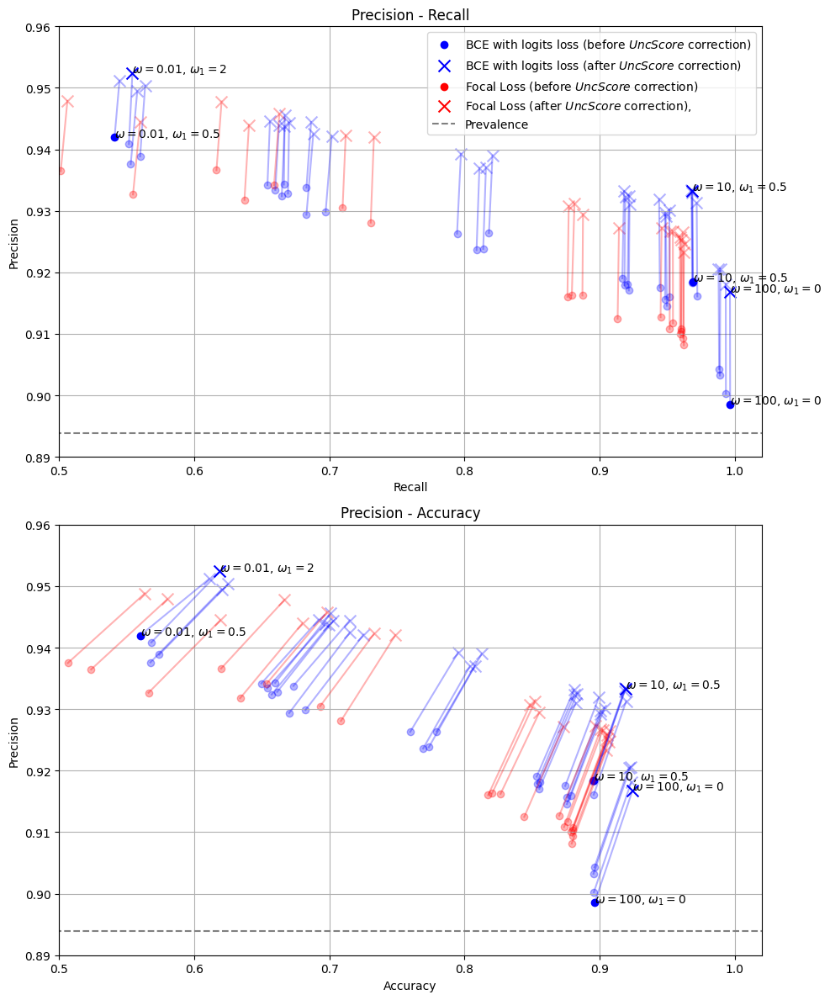

In [90]:
dict_best = {'BCE with logits, w = 0.01, w1 = 0.5': r'$\omega = 0.01$, $\omega_1 = 0.5$',
             'BCE with logits, w = 100, w1 = 0': r'$\omega = 100$, $\omega_1 = 0$',
             'BCE with logits, w = 10, w1 = 0.5': r'$\omega = 10$, $\omega_1 = 0.5$'}

dict_best_corrected = {'BCE with logits, w = 0.01, w1 = 2': r'$\omega = 0.01$, $\omega_1 = 2$',
                       'BCE with logits, w = 100, w1 = 0': r'$\omega = 100$, $\omega_1 = 0$',
                       'BCE with logits, w = 10, w1 = 0.5': r'$\omega = 10$, $\omega_1 = 0.5$'}
l = []
fig, ax = plt.subplots(2, 1, figsize=(10, 12))
arrow = True
for d, n in zip(mlp_results_after_us_bcewl.values(),
                   mlp_results_after_us_bcewl.keys()):
    result = d
    c='b'
    alpha = 0.3
    alpha_corr = 0.3
    if n in dict_best.keys():
        ax[0].annotate(dict_best[n], (result["mean recall"], result["mean precision"]))
        ax[1].annotate(dict_best[n], (result["mean acc"], result["mean precision"]))
        alpha = 1
    if n in dict_best_corrected.keys():
        ax[0].annotate(dict_best_corrected[n], (result["corrected mean recall"], result["corrected mean precision"]))
        ax[1].annotate(dict_best_corrected[n], (result["corrected mean acc"], result["corrected mean precision"]))
        alpha_corr = 1
    ax[0].scatter(result["mean recall"], result["mean precision"], color=c, alpha=alpha)
    ax[1].scatter(result["mean acc"], result["mean precision"], color=c, alpha=alpha)
    ax[0].scatter(result["corrected mean recall"], result["corrected mean precision"], color=c, marker='x', s=100, alpha=alpha_corr)
    ax[1].scatter(result["corrected mean acc"], result["corrected mean precision"], color=c, marker='x', s=100, alpha=alpha_corr)
    if arrow:
        ax[0].plot((result["corrected mean recall"], result["mean recall"]), 
                    (result["corrected mean precision"], result["mean precision"]), 
                   color=c, alpha=0.3)
        ax[1].plot((result["corrected mean acc"], result["mean acc"]), 
                    (result["corrected mean precision"], result["mean precision"]), 
                   color=c, alpha=0.3)
legend = ax[0].scatter(0, 0, color=c, alpha=1)
l.append(legend)
legend = ax[0].scatter(0, 0, color=c, marker='x', s=100, alpha=1)
l.append(legend)
        
for d, n in zip(mlp_results_after_us_focal.values(),
                   mlp_results_after_us_focal.keys()):
    result = d
    c='r'
    alpha = 0.3
    alpha_corr = 0.3
    if n in dict_best.keys():
        ax[0].annotate(dict_best[n], (result["mean recall"], result["mean precision"]))
        ax[1].annotate(dict_best[n], (result["mean acc"], result["mean precision"]))
        alpha = 1
    if n in dict_best_corrected.keys():
        ax[0].annotate(dict_best_corrected[n], (result["corrected mean recall"], result["corrected mean precision"]))
        ax[1].annotate(dict_best_corrected[n], (result["corrected mean acc"], result["corrected mean precision"]))
        alpha_corr = 1
    ax[0].scatter(result["mean recall"], result["mean precision"], color=c, alpha=alpha)
    ax[1].scatter(result["mean acc"], result["mean precision"], color=c, alpha=alpha)
    ax[0].scatter(result["corrected mean recall"], result["corrected mean precision"], color=c, marker='x', s=100, alpha=alpha_corr)
    ax[1].scatter(result["corrected mean acc"], result["corrected mean precision"], color=c, marker='x', s=100, alpha=alpha_corr)
    if arrow:
        ax[0].plot((result["mean recall"], result["corrected mean recall"]), (result["mean precision"], result["corrected mean precision"]),
                   color=c, alpha=0.3)
        ax[1].plot((result["corrected mean acc"], result["mean acc"]), 
                    (result["corrected mean precision"], result["mean precision"]), 
                   color=c, alpha=0.3
                  )
legend = ax[0].scatter(0, 0, color=c, alpha=1)
l.append(legend)
legend = ax[0].scatter(0,0, color=c, marker='x', s=100, alpha=1)
l.append(legend)

ax[0].plot((0.39, 1.02), (0.8939, 0.8939), c="grey", linestyle = '--', label = "Prevalence")
legend = ax[1].plot((0.39, 1.02), (0.8939, 0.8939), c="grey", linestyle = '--', label = "Prevalence")
l.append(legend[0])
ax[0].grid()
ax[1].grid()
ax[0].set_xlim(0.5, 1.02)
ax[1].set_xlim(0.5, 1.02)
ax[0].set_ylim(0.89, 0.96)
ax[1].set_ylim(0.89, 0.96)
ax[0].set_xlabel("Recall")
ax[0].set_ylabel("Precision")
ax[0].set_title("Precision - Recall")
ax[1].set_xlabel("Accuracy")
ax[1].set_ylabel("Precision")
ax[1].set_title("Precision - Accuracy")
ax[0].legend(l,
           [r"BCE with logits loss (before $UncScore$ correction)", r"BCE with logits loss (after $UncScore$ correction)",
            r'Focal Loss (before $UncScore$ correction)', r"Focal Loss (after $UncScore$ correction),", "Prevalence"])
plt.tight_layout()
plt.savefig('Precision_recall_accuracy_MLP_after_US_final_revised_v2.png')

In [74]:
with open("results_final_bcewl_revised_v2.pkl", "wb") as fp: 
    pickle.dump(mlp_results_after_us_bcewl, fp)

In [75]:
with open("results_final_focal_loss_revised_v2.pkl", "wb") as fp: 
    pickle.dump(mlp_results_after_us_focal, fp)

In [76]:
with open("results_final_bcewl_revised_v2.pkl", "rb") as fp: 
    mlp_results_after_us_bcewl = pickle.load(fp)

In [77]:
with open("results_final_focal_loss_revised_v2.pkl", "rb") as fp: 
    mlp_results_after_us_focal = pickle.load(fp)

# 5. Calculate metrics between datasets
## 5.1. Move files to a new directory

In [ ]:
df_transformed_load = pd.read_csv('sythetic_image_one-class_classification_results_revised_v2.csv')

R = 'real_images_png/' # All the real images used to train StyleGAN-2-ADA converted to PNG
S = 'synthetic_images_png/' # All the synthetic images generated converted to PNG
# Subsets of the synthetic images
H2 = 'good_quality_png/' # Only the good images
H3 = 'good_quality_v2_png/' # Only the good images
L3 = 'low_quality_png_v2_png/' # All the low quality images
L2 = 'low_quality/' # All the low quality images
H1 = 'all_excpt_anomalies_png/' # All the images except the anomalous ones detected by the One-class classifier as anomalies
L1 = 'anomalies_png/' # Images detected by the One-class classifier as anomalies
exept_U1 = 'all_excpt_high_JS_D_png/' # All the images except the ones with high Jensen–Shannon divergence (>0.1) (old US)
U1 = 'high_JS_D_png/' # Images with high Jensen–Shannon divergence (>0.1) (old US)
exept_U2 = 'all_excpt_high_US_png/' # All the images except the ones with high US (>0.1)
U2 = 'high_US/' # Images with high US (>0.1)

US_th=0.035

png_test_dir = os.path.join("result_images/converted_to_png/", "test")
png_train_dir = os.path.join("result_images/converted_to_png/", "train")
test_dir = os.path.join(data_dir, TEST)
train_dir = os.path.join(data_dir, TRAIN)
if not os.path.isdir(os.path.join(png_test_dir, H3)):
    os.makedirs(os.path.join(png_train_dir, R))
    os.makedirs(os.path.join(png_test_dir, S))
    os.mkdir(os.path.join(png_test_dir, H3))
    os.mkdir(os.path.join(png_test_dir, H2))
    os.mkdir(os.path.join(png_test_dir, H1))
    os.mkdir(os.path.join(png_test_dir, L1))
    os.mkdir(os.path.join(png_test_dir, exept_U1))
    os.mkdir(os.path.join(png_test_dir, U1))
    os.mkdir(os.path.join(png_test_dir, exept_U2))
    os.mkdir(os.path.join(png_test_dir, U2))
    os.mkdir(os.path.join(png_test_dir, L3))
    os.mkdir(os.path.join(png_test_dir, L2))
    for i, row in tqdm(df_transformed_load.iterrows()):
        imname = row['image_name']
        img = Image.open(os.path.join(test_dir, imname))
        if row['good_images'] == True:
            pth = os.path.join(png_test_dir, H3)
        else:
            pth = os.path.join(png_test_dir, L3)
        img.save(os.path.join(pth, imname.replace('.tiff', '.png')))

        if row['prediction_isolation_forest']==1 and row['uncertainty_score']<=US_th:
            pth = os.path.join(png_test_dir, H2)
        else:
            pth = os.path.join(png_test_dir, L2)
        img.save(os.path.join(pth, imname.replace('.tiff', '.png')))
        
        if row['prediction_isolation_forest']==-1:
            pth = os.path.join(png_test_dir, L1)
        else:
            pth = os.path.join(png_test_dir, H1)
        img.save(os.path.join(pth, imname.replace('.tiff', '.png')))
            
        if row['uncertainty_score_v2']>US_th:
            pth = os.path.join(png_test_dir, U2)
        else:
            pth = os.path.join(png_test_dir, exept_U2)
        img.save(os.path.join(pth, imname.replace('.tiff', '.png')))
        
        if row['uncertainty_score']>US_th:
            pth = os.path.join(png_test_dir, U1)
        else:
            pth = os.path.join(png_test_dir, exept_U1)
        img.save(os.path.join(pth, imname.replace('.tiff', '.png')))

        pth = os.path.join(png_test_dir, S)
        img.save(os.path.join(pth, imname.replace('.tiff', '.png')))

    for imname in tqdm(os.listdir(train_dir)):
        img = Image.open(os.path.join(train_dir, imname))
        img.save(os.path.join(os.path.join(png_train_dir, R), imname.replace('.tiff', '.png')))

## 5.2. Calculate metrics

In [87]:
target_dirs = [
                os.path.join(png_test_dir, S),
                os.path.join(png_test_dir, L1),
                os.path.join(png_test_dir, H1),
                os.path.join(png_test_dir, L2),
                os.path.join(png_test_dir, H2),
                os.path.join(png_test_dir, L3),
                os.path.join(png_test_dir, H3),
               ]

### 5.2.1. FID

In [88]:
for dir in target_dirs:
    print(f"========================================================================================")
    print(dir)
    result = subprocess.getstatusoutput(f"python -m pytorch_fid {os.path.join(png_train_dir, R)} {dir}")
    print(str(result[-1]).replace("n","\\\n").splitlines()[-1:][0])
    gc.collect()
    torch.cuda.empty_cache()

converted_to_png/test/synthetic_images_png/
FID:  4.969467488558735
converted_to_png/test/anomalies_png/
FID:  20.14976706450058
converted_to_png/test/all_excpt_anomalies_png/
FID:  4.721887657120988
converted_to_png/test/low_quality/
FID:  12.8125708261733
converted_to_png/test/good_quality_png/
FID:  5.207469042379401
converted_to_png/test/low_quality_png_v2_png/
FID:  15.843747402638996
converted_to_png/test/good_quality_v2_png/
FID:  4.854624153408338


### 5.2.2. KID, IS

In [89]:
os.system("chmod +x run_metrics.sh")
for dir in target_dirs:
    print(f"========================================================================================")
    print(dir)      
    result = subprocess.getstatusoutput(f"./run_metrics.sh  {dir} {os.path.join(png_train_dir, R)}")
    dict_res = ast.literal_eval(str(result[-1]).splitlines()[-1:][0])
    IS = [float(f'{i:.3f}') for i in dict_res["IS"]]
    KID = float(f'{dict_res["KID"]:.3f}')
    print(f"IS [mean, std]: {IS}")
    print(f"KID: {KID}")
    gc.collect()
    torch.cuda.empty_cache()

converted_to_png/test/synthetic_images_png/
IS [mean, std]: [1.502, 0.007]
KID: 0.001
converted_to_png/test/anomalies_png/
IS [mean, std]: [1.708, 0.052]
KID: 0.012
converted_to_png/test/all_excpt_anomalies_png/
IS [mean, std]: [1.471, 0.007]
KID: 0.001
converted_to_png/test/low_quality/
IS [mean, std]: [1.643, 0.032]
KID: 0.006
converted_to_png/test/good_quality_png/
IS [mean, std]: [1.44, 0.011]
KID: 0.002
converted_to_png/test/low_quality_png_v2_png/
IS [mean, std]: [1.68, 0.033]
KID: 0.008
converted_to_png/test/good_quality_v2_png/
IS [mean, std]: [1.45, 0.007]
KID: 0.001
